In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
import statsmodels.api as sm

sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')
from sklearn.model_selection import train_test_split

In [2]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [3]:
sns.set_context('poster')
sns.set_style('white')

In [4]:
plt.rcParams["figure.dpi"] = 300

In [5]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['X', 'P', 's', 'D', 'o']
aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'
e2_color= '#f2f2f2'
eallorder= ['e1','e2', 'e3', 'e4', 'e5', 'e6']
eallpallete = ['#6cf0ba', '#f2f2f2', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']

efcmorder= ['e1','e2', 'e4', 'e5', ]
efcmpallete = ['#6cf0ba', '#f2f2f2',  '#eeb7cb', '#b9d2d8',]

espallete = ['#6cf0ba', '#D55282', '#538B9B']
#  604 #FCC479
#     #ffd7a1
#     #fcb14c
#     MED4 = #62A586
#     9313 #F47681
#     natl #7A9BC8

In [6]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
psizes = [150,120,200,120,350]
pmarkers = ['o', 's', '^', 'D', '*']

# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['P', 'X', 'h', '<','>']
apallete = ['#6dad36', '#c7e89f', '#f5c4e1', '#d5579d', '#8a0850']

aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'

espallete = ['#6cf0ba', '#D55282', '#538B9B']

In [7]:
df = pd.read_pickle('CCPA.pkl.gz')
df.loc[df.PRO == 'C9B', 'PRO'] = 'MIT0604'

In [8]:
fcmdflist=list()
for i in os.listdir('fcmfiles'):
    if i.endswith('.csv'):
        d = pd.read_csv(os.path.join('fcmfiles', i))
        n = os.path.splitext(i)[0]
        _, experiment, day = n.split('_')
        d['experiment'] = experiment
        d['day'] = day.replace('Days','')
        fcmdflist.append(d)
fcmdf = pd.concat(fcmdflist)
fcmdf.loc[fcmdf.PRO == 'C9B', 'PRO'] = 'MIT0604'
fcmdf['day'] = pd.to_numeric(fcmdf['day'])

In [9]:
fl2cell_model, compdf = cp.gen_FL2cells_model()
df['cells'] = cp.compute_FL2cells(df['FL'], fl2cell_model)
df['logcells'] = np.log(df['cells'])

                            OLS Regression Results                            
Dep. Variable:                    FCM   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.691
Method:                 Least Squares   F-statistic:                     776.5
Date:                Fri, 13 Nov 2020   Prob (F-statistic):           2.49e-90
Time:                        12:24:55   Log-Likelihood:                -6527.3
No. Observations:                 347   AIC:                         1.306e+04
Df Residuals:                     345   BIC:                         1.307e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -5.769e+05   3.27e+06     -0.177      0.8

C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2580: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


In [10]:
def calculate_lag(d):
    minday_fl_threshold = 0.1
    r2_threshold = 0.9

    d = d.reset_index(drop=True)
    maxindex = d.FL.idxmax()
    maxday = d.loc[maxindex]['day']
    minday = d.loc[(d.day < maxday) & (d.FL <= minday_fl_threshold), 'day'].max()
    if minday is np.NaN:
        minday = d.day.min()
    
    minday = min(maxday-7,minday)
    
    reg, intercept, coef, r2 = cp.fit_regression(d.loc[(d.day > minday) & 
                                                       (d.day <= maxday)], 'day', 'logcells')
                        
    L = maxday - ((d.loc[maxindex]['logcells'] - d.loc[0]['logcells']) / coef)
    return pd.Series({
        'maxday' : maxday,
        'minday' : minday,
        'maxlogcells' : d.loc[maxindex]['logcells'],
        'maxcells' : d.loc[maxindex]['cells'],
        'logcells0' : d.loc[0]['logcells'],
        'log10cells0' : np.log10(d.loc[0]['cells']),
        'intercept': intercept,
        'coef': coef,
        'r2': r2,
        'L' : L,
    })

def get_prev_max_day_df(d, minmaxday_threshold):
    d = d.reset_index(drop=True)
    maxindex = d.FL.idxmax()
    maxday = d.loc[maxindex]['day']
    maxdaysdf = d.loc[(d.FL > d.FL.shift()) & (d.FL > d.FL.shift(-1)) & 
                    (d.day < maxday)].reset_index(drop=True)
    if maxdaysdf.shape[0] > 0:
        newmaxindex = maxdaysdf.FL.idxmax()
        newmaxday = maxdaysdf.loc[newmaxindex]['day']

        if ((newmaxday is not np.NaN) and #(newmaxday >= minmaxday_threshold) and 
            (d.loc[d.day == newmaxday, 'FL'].max() > (d.FL.max() / 2))):
            df_prevmax = d.loc[d.day < newmaxday]
            return df_prevmax
    return None

def get_no_outlier_df(d, minday_fl_threshold):
    d_no_outlier = d.loc[(d.FL > minday_fl_threshold) | 
                         (d.FL.shift() < minday_fl_threshold*2) |
                         (d.FL.shift(-1) < minday_fl_threshold*2)
                        ]
    return d_no_outlier

def get_without_max_df(d):
    d = d.reset_index(drop=True)
    maxindex = d.FL.idxmax()
    maxday = d.loc[maxindex]['day']
    d_withoutmaxday = d.loc[d.day < maxday]
    return d_withoutmaxday

def get_df_list(d, minday_fl_threshold, minmaxday_threshold):
    dnomax = get_without_max_df(d)
    dnomax2 = get_without_max_df(dnomax)
    
    df_list = [d, dnomax, dnomax2]
    df_list.extend([get_no_outlier_df(x, minday_fl_threshold) for x in df_list])
    return df_list

def calculate_lag_wrap(d):
    minday_fl_threshold = 0.07
    minmaxday_threshold = 4
    df_list = get_df_list(d, minday_fl_threshold, minmaxday_threshold)
    d2 = get_prev_max_day_df(d,minmaxday_threshold)
    if d2 is not None:
        df_list.extend(get_df_list(d2, minday_fl_threshold, minmaxday_threshold))
    reslist = [calculate_lag(x) for x in df_list]

    sorted_reslist = sorted(reslist, key=lambda x : x['r2'], reverse=True)
    return sorted_reslist[0]           

In [11]:
def computeL(maxday, maxlogcells, logcells0, coef):
    L = maxday - ((maxlogcells - logcells0) / coef)
    return L


In [12]:
def computeMaxDay(maxlogcells, logcells0, coef, L):
    maxday = ((maxlogcells - logcells0) / coef) + L
    return maxday


In [13]:
df = df.loc[~df.experiment.isin(['e7'])]

In [14]:
lagsdf = df.groupby(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample']).apply(calculate_lag_wrap)\
        .reset_index()

In [15]:
lagsdf.head()

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,logcells0,log10cells0,intercept,coef,r2,L
0,e1,10A,MIT0604,DE,Co_Culture,"e1, 10A",13.694444,0.715972,19.037963,1.853882e+08,14.244403,6.186266,14.626898,0.313703,0.993199,-1.586110
1,e1,10B,MIT0604,DE,Co_Culture,"e1, 10B",14.960417,0.715972,19.107290,1.986966e+08,14.013287,6.085893,14.571737,0.314278,0.982713,-1.248146
2,e1,10C,MIT0604,DE,Co_Culture,"e1, 10C",14.960417,0.000000,19.115056,2.002457e+08,14.373296,6.242243,14.604112,0.311066,0.991391,-0.283185
3,e1,11A,MED4,DE1,Co_Culture,"e1, 11A",10.603472,0.000000,18.447188,1.026862e+08,15.371426,6.675725,14.862117,0.339805,0.997146,1.551911
4,e1,11B,MED4,DE1,Co_Culture,"e1, 11B",13.694444,0.000000,19.184498,2.146455e+08,15.584693,6.768346,15.006562,0.303269,0.998574,1.824440


In [16]:
lagsdf.columns

Index(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample',
       'maxday', 'minday', 'maxlogcells', 'maxcells', 'logcells0',
       'log10cells0', 'intercept', 'coef', 'r2', 'L'],
      dtype='object')

In [17]:
lagsdf = lagsdf.loc[~lagsdf.experiment.isin(['e7'])]

In [18]:
fcmdf.head()

,PRO,ALT,sample,PRO.1,ALT.1,experiment,day
0,MED4,1A3,1A,7.485642e+06,2.992351e+07,exp1,100
1,MED4,1A3,1B,6.720907e+06,2.159764e+07,exp1,100
2,MED4,1A3,1C,1.121335e+07,1.742056e+07,exp1,100
3,MIT9313,1A3,2A,1.415617e+06,5.134250e+06,exp1,100
4,MIT9313,1A3,2B,1.018640e+06,4.885134e+06,exp1,100


In [19]:
fcmdf.loc[(fcmdf.experiment == 'exp1') & (fcmdf.day == 60), 'e'] = 'e2'
fcmdf.loc[(fcmdf.experiment == 'exp1') & (fcmdf.day == 100), 'e'] = 'e4'
fcmdf.loc[(fcmdf.experiment == 'exp1') & (fcmdf.day == 140), 'e'] = 'e5'
fdf = fcmdf.dropna(subset=['e'])
fdf.loc[:,'experiment_sample'] = fdf['e'] + ', '+ fdf['sample']
fdf['initialcells'] = fdf['PRO.1']/20
fdf['initiallogcells'] = np.log(fdf['PRO.1']/20)
fdf['initiallog10cells'] = np.log10(fdf['PRO.1']/20)

fdf.head()

C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\indexing.py:480: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
C:\Users\wosnat\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

,PRO,ALT,sample,PRO.1,ALT.1,experiment,day,e,experiment_sample,initialcells,initiallogcells,initiallog10cells
0,MED4,1A3,1A,7.485642e+06,2.992351e+07,exp1,100,e4,"e4, 1A",374282.11585,12.832765,5.573199
1,MED4,1A3,1B,6.720907e+06,2.159764e+07,exp1,100,e4,"e4, 1B",336045.34005,12.725001,5.526398
2,MED4,1A3,1C,1.121335e+07,1.742056e+07,exp1,100,e4,"e4, 1C",560667.50650,13.236883,5.748705
3,MIT9313,1A3,2A,1.415617e+06,5.134250e+06,exp1,100,e4,"e4, 2A",70780.85640,11.167344,4.849916
4,MIT9313,1A3,2B,1.018640e+06,4.885134e+06,exp1,100,e4,"e4, 2B",50931.98990,10.838246,4.706991


In [20]:
fdf.columns

Index(['PRO', 'ALT', 'sample', 'PRO.1', 'ALT.1', 'experiment', 'day', 'e',
       'experiment_sample', 'initialcells', 'initiallogcells',
       'initiallog10cells'],
      dtype='object')

In [21]:
lagsdf = pd.merge(lagsdf, fdf[['experiment_sample', 'initialcells', 'initiallogcells',
       'initiallog10cells']], on='experiment_sample', how='left')
lagsdf.loc[lagsdf.experiment == 'e1', 'initiallogcells'] = np.log(1e6)


In [22]:
lagsdf.loc[lagsdf.experiment == 'e1', 'initialcells'] = 1e6
lagsdf.loc[lagsdf.experiment == 'e1', 'initiallog10cells'] = np.log10(1e6)


In [23]:
lagsdf.loc[lagsdf['sample'] == '8C']

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,logcells0,log10cells0,intercept,coef,r2,L,initialcells,initiallogcells,initiallog10cells
87,e1,8C,MIT9312,DE,Co_Culture,"e1, 8C",13.694444,0.715972,19.032631,1.844024e+08,13.983972,6.073162,14.897213,0.301280,0.994672,-3.062893,1000000.0000,13.815511,6.000000
165,e2,8C,MIT9312,DE,Co_Culture,"e2, 8C",11.110000,3.230000,18.646136,1.252893e+08,14.013287,6.085893,13.694917,0.453820,0.992841,0.901431,811105.9910,13.606154,5.909078
240,e3,8C,MIT9312,DE,Co_Culture,"e3, 8C",14.000000,7.000000,17.120083,2.723691e+07,13.983972,6.073162,9.846954,0.520217,0.999829,7.971536,NaN,NaN,NaN
316,e4,8C,MIT9312,DE,Co_Culture,"e4, 8C",15.140000,8.140000,18.005701,6.603538e+07,13.983972,6.073162,11.258252,0.449870,0.991991,6.200242,648425.6925,13.382303,5.811860
385,e5,8C,MIT9312,DE,Co_Culture,"e5, 8C",36.890000,29.830000,17.992283,6.515520e+07,13.983972,6.073162,1.672492,0.442149,0.999337,27.824483,335.0000,5.814131,2.525045
455,e6,8C,MIT9312,DE,Co_Culture,"e6, 8C",30.590000,20.740000,17.657886,4.663615e+07,13.983972,6.073162,4.873930,0.416000,0.962017,21.758471,NaN,NaN,NaN


In [24]:
lagsdf.groupby('experiment')['initiallogcells'].describe().T

experiment,e1,e2,e3,e4,e5,e6
count,9.100000e+01,73.000000,0.0,72.000000,64.000000,0.0
mean,1.381551e+01,13.823901,NaN,12.694245,8.445367,NaN
std,1.786198e-15,0.633059,NaN,1.308090,2.655586,NaN
min,1.381551e+01,12.451996,NaN,5.873385,3.332205,NaN
25%,1.381551e+01,13.498208,NaN,12.528219,6.269816,NaN
50%,1.381551e+01,13.897295,NaN,13.077763,8.268281,NaN
75%,1.381551e+01,14.277954,NaN,13.420939,10.948008,NaN
max,1.381551e+01,15.174508,NaN,14.218358,12.698033,NaN


In [25]:
lagsdf['L_init'] = lagsdf.apply(lambda x: computeL(x['maxday'], x['maxlogcells'], x['initiallogcells'], x['coef']), axis=1)

In [26]:
e1coef_df = lagsdf.loc[lagsdf.experiment == 'e1', ['sample', 'coef', 'L_init'] ]
e1coef_df.index = e1coef_df['sample']

lagsdf['e1 coef'] = lagsdf['sample'].map(e1coef_df['coef'])
lagsdf['e1 L_init'] = lagsdf['sample'].map(e1coef_df['L_init'])


In [27]:
lagsdf['L_init_e1coef'] = lagsdf.apply(
    lambda x: computeL(x['maxday'], x['maxlogcells'], x['initiallogcells'], x['e1 coef']), axis=1)

In [28]:
lagsdf['maxday_e1'] = lagsdf.apply(
    lambda x: computeMaxDay(x['maxlogcells'], x['initiallogcells'], x['e1 coef'], x['e1 L_init']), axis=1)

In [29]:
lagsdf.to_pickle('growth_lag.pkl.gz')

In [30]:
le1df = lagsdf.loc[lagsdf.experiment == 'e1']

In [31]:
le1df.columns

Index(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample',
       'maxday', 'minday', 'maxlogcells', 'maxcells', 'logcells0',
       'log10cells0', 'intercept', 'coef', 'r2', 'L', 'initialcells',
       'initiallogcells', 'initiallog10cells', 'L_init', 'e1 coef',
       'e1 L_init', 'L_init_e1coef', 'maxday_e1'],
      dtype='object')

In [32]:
(le1df.maxday - le1df.maxday_e1).value_counts()

0.000000e+00    89
6.661338e-16     1
8.881784e-16     1
dtype: int64

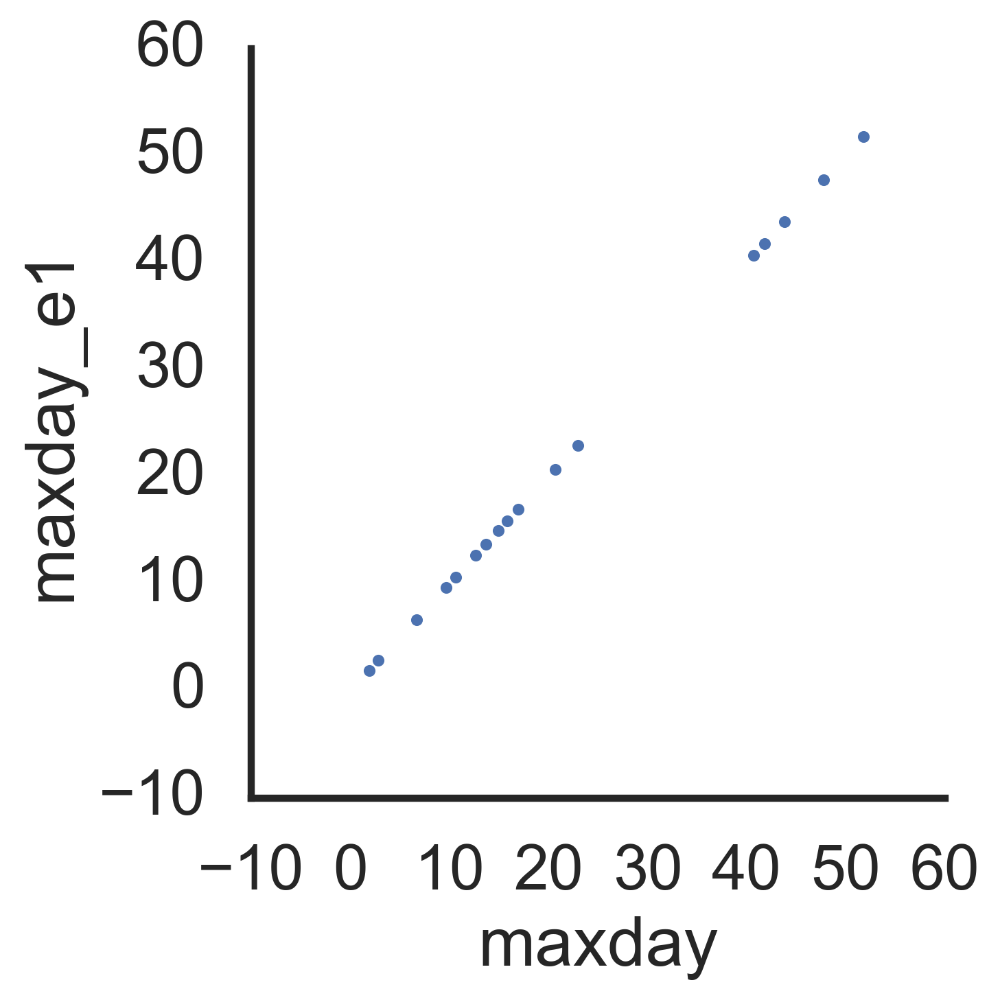

In [33]:
sns.relplot(data=le1df, x='maxday', y='maxday_e1')

In [34]:
sns.set_context('talk')
sns.set_style('white')


In [35]:
lagsdf.columns

Index(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample',
       'maxday', 'minday', 'maxlogcells', 'maxcells', 'logcells0',
       'log10cells0', 'intercept', 'coef', 'r2', 'L', 'initialcells',
       'initiallogcells', 'initiallog10cells', 'L_init', 'e1 coef',
       'e1 L_init', 'L_init_e1coef', 'maxday_e1'],
      dtype='object')

In [36]:
maxdf = df.groupby(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample'])['FL'].max()\
        .reset_index()

In [37]:
maxdf['experiment1'] = maxdf.experiment.str.replace('e', '')
maxdf.loc[maxdf.experiment.isin(['e1']) & maxdf['culture'].isin(['Axenic']), 'experiment1'] = 'AX'

In [38]:
maxdf.experiment1.value_counts()

2     78
1     78
4     77
3     74
6     70
5     69
AX    13
Name: experiment1, dtype: int64

In [39]:
lagsdf['experiment1'] = lagsdf.experiment.str.replace('e', '')
lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf['culture'].isin(['Axenic']), 'experiment1'] = 'AX'

Text(0.5, 1.0, 'maximum number of cells')

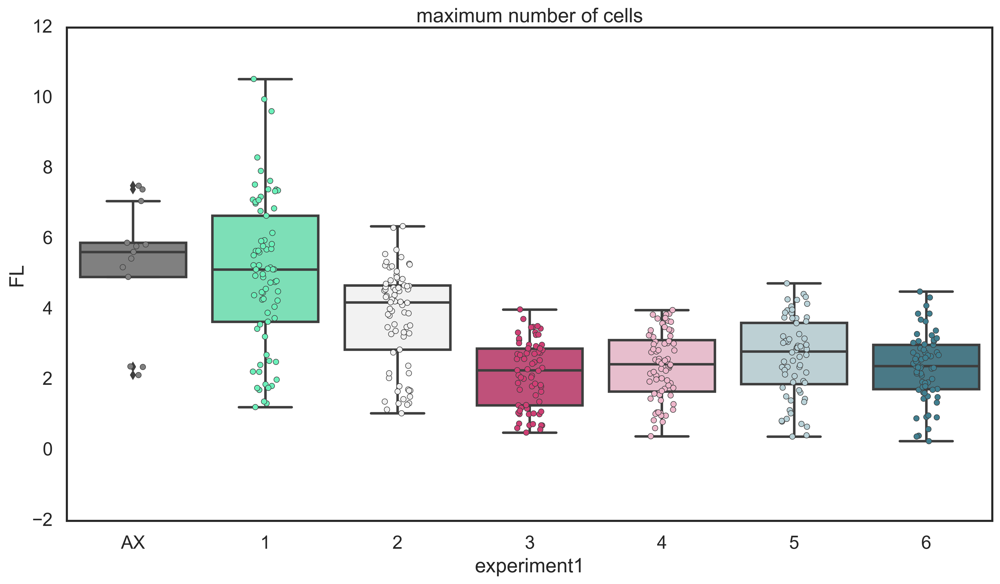

In [40]:
ax = sns.boxplot(data=maxdf.loc[maxdf['culture'].isin(['Axenic', 'Co_Culture'])], 
            x='experiment1', y='FL', #kind='box', 
                #aspect=1.3,
           order=['AX'] + ['1','2', '3', '4','5','6'], 
            palette=['grey'] + eallpallete
           )
ax = sns.stripplot(data=maxdf.loc[maxdf['culture'].isin(['Axenic', 'Co_Culture'])], 
            x='experiment1', y='FL',  #aspect=1.3,
            order=['AX'] + ['1','2', '3', '4','5','6'], 
            palette=['grey'] + eallpallete,
            linewidth=0.5,
            ax=ax
           )

#plt.yscale('log')
plt.title('maximum number of cells')

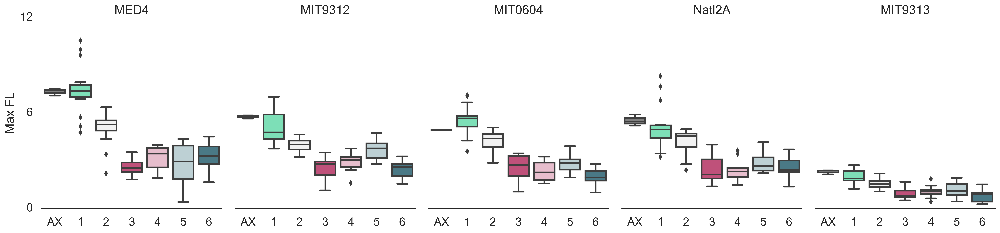

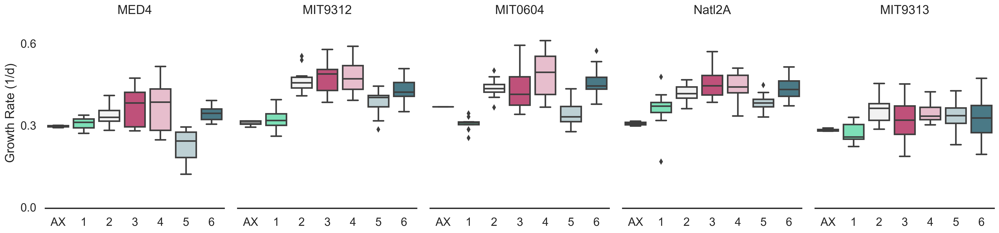

In [41]:

g= sns.catplot(data=maxdf.loc[maxdf['culture'].isin(['Axenic', 'Co_Culture'])], 
            x='experiment1', y='FL', kind='box', 
            order=['AX'] + ['1','2', '3', '4','5','6'], 
            palette=['grey'] + eallpallete,
            aspect=0.8, height=5,
            col='PRO', col_order=porder)
#plt.ylabel('Max Cells (x10^8 cells/ml)')
#ax.set_ylabel('')    
#ax.set_xlabels()
g.set_axis_labels(x_var='', y_var='Max FL' )
g.set_titles("{col_name}")  
g.set(yticks=[0, 6 ,12])
g.despine(top=True, right=True, left=True, #bottom=True
         )
#plt.suptitle('maximum Fluorencence', y=1.05)
g =sns.catplot(data=lagsdf.loc[lagsdf['culture'].isin(['Axenic', 'Co_Culture'])], 
            x='experiment1', y='coef', kind='box', 
            order=['AX'] + ['1','2', '3', '4','5','6'], 
            palette=['grey'] + eallpallete,
#           order=eallorder, palette=eallpallete,
            aspect=0.8, height=5,
            col='PRO', col_order=porder)
g.set_axis_labels(x_var='', y_var='Growth Rate (1/d)')
g.set_titles("{col_name}")  
g.set(yticks=[0, 0.3 ,0.6])
g.despine(top=True, right=True, left=True)

#plt.suptitle('Growth Rate', y=1.05)
    

In [42]:
sns.set_style('white')
sns.set_context('talk')

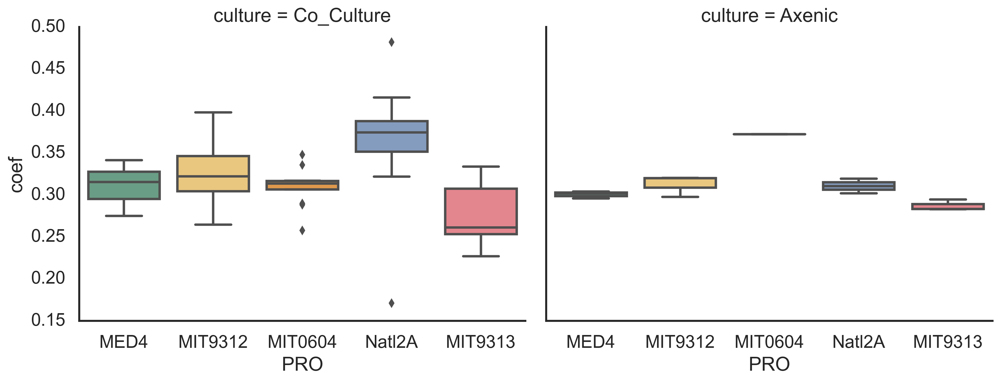

In [43]:
    sns.catplot(data=lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf.culture.isin(['Axenic', 'Co_Culture'])]
                , x='PRO', y='coef', kind='box', aspect=1.3, col='culture',
               order=porder, palette=ppallete)
    #plt.title(i)

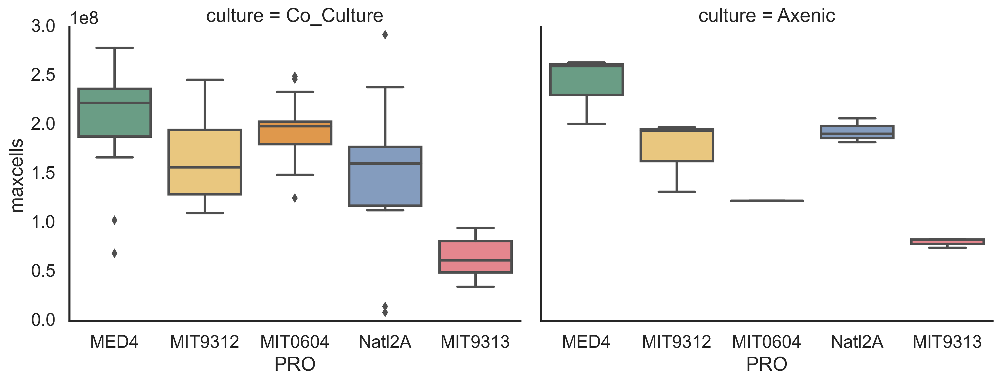

In [44]:
    sns.catplot(data=lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf.culture.isin(['Axenic', 'Co_Culture'])]
                , x='PRO', y='maxcells', kind='box', aspect=1.3, col='culture',
               order=porder, palette=ppallete)
    #plt.title(i)

In [45]:
lagsdf['experiment1'] = lagsdf.experiment
lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf['culture'].isin(['Axenic']), 'experiment1'] = 'Axenic'

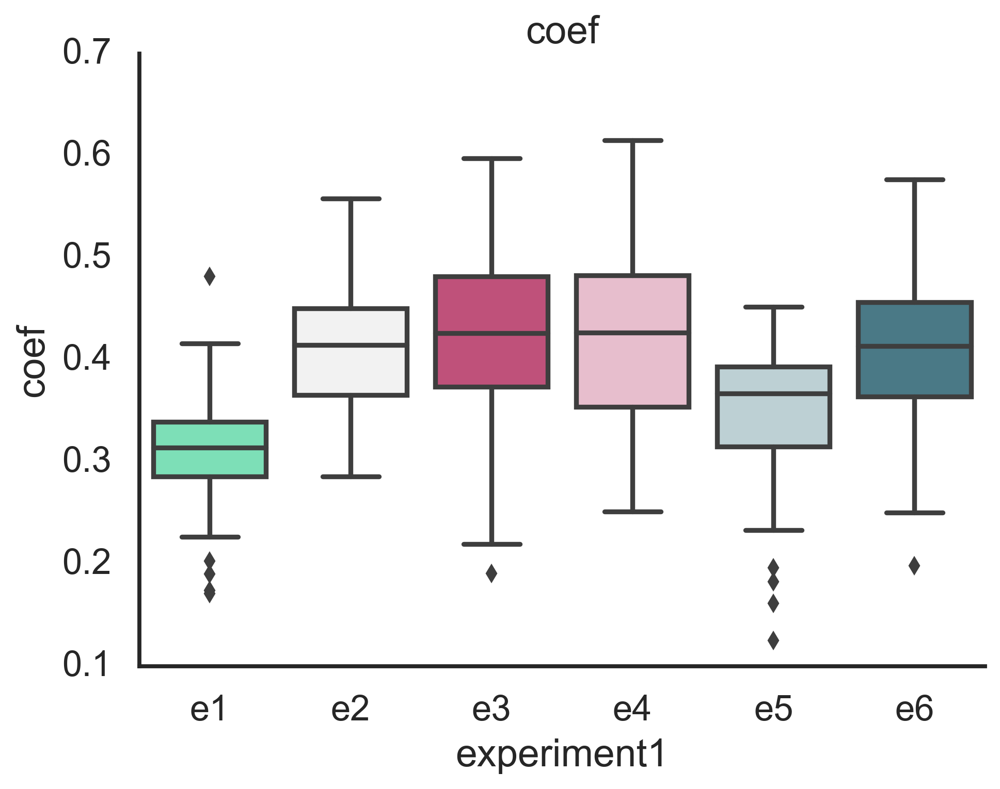

In [46]:
for i in [ 'coef', ]:
    sns.catplot(data=lagsdf, x='experiment1', y=i, kind='box', aspect=1.3,
               order=eallorder, palette=eallpallete)
    plt.title(i)

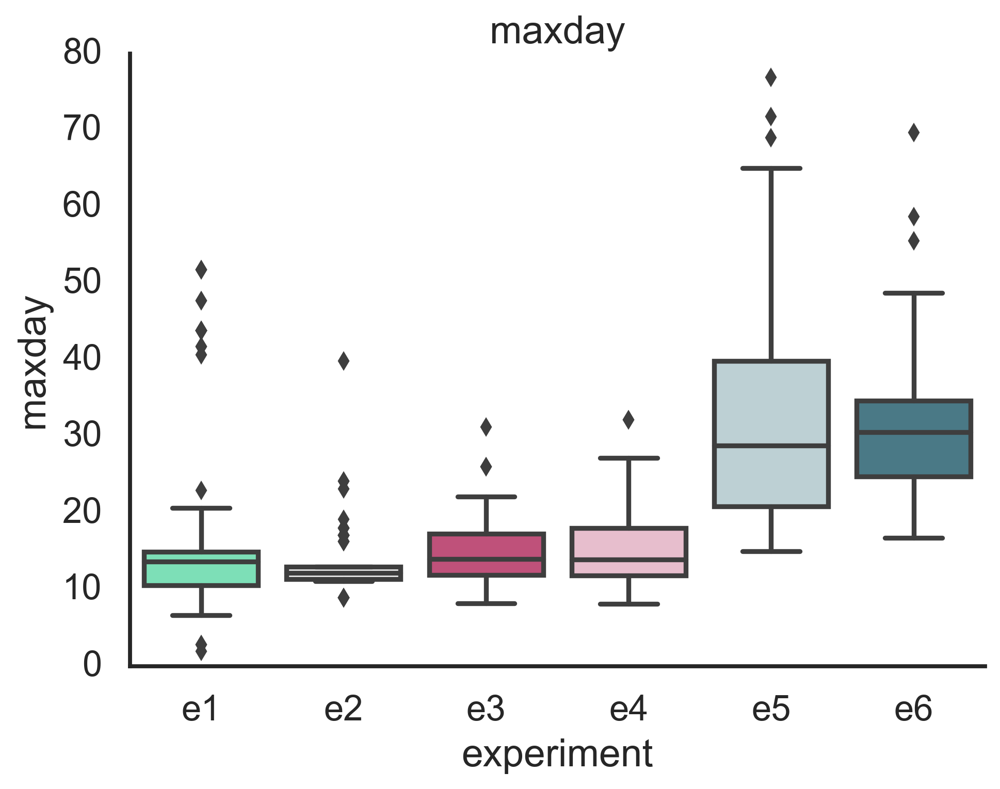

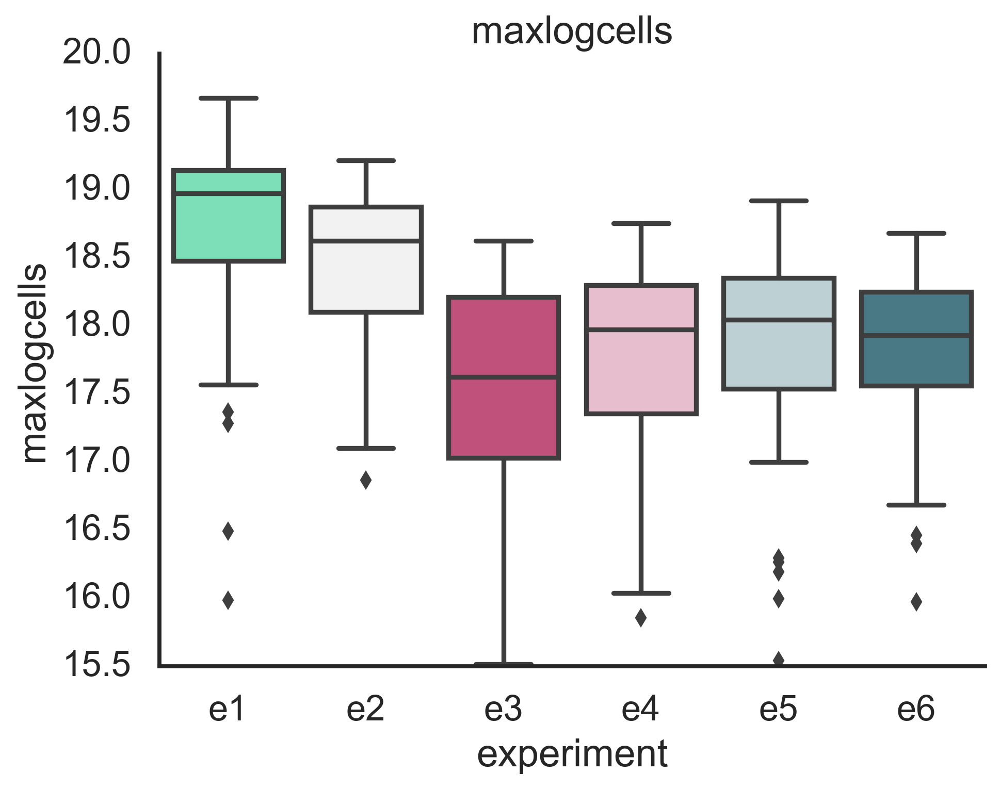

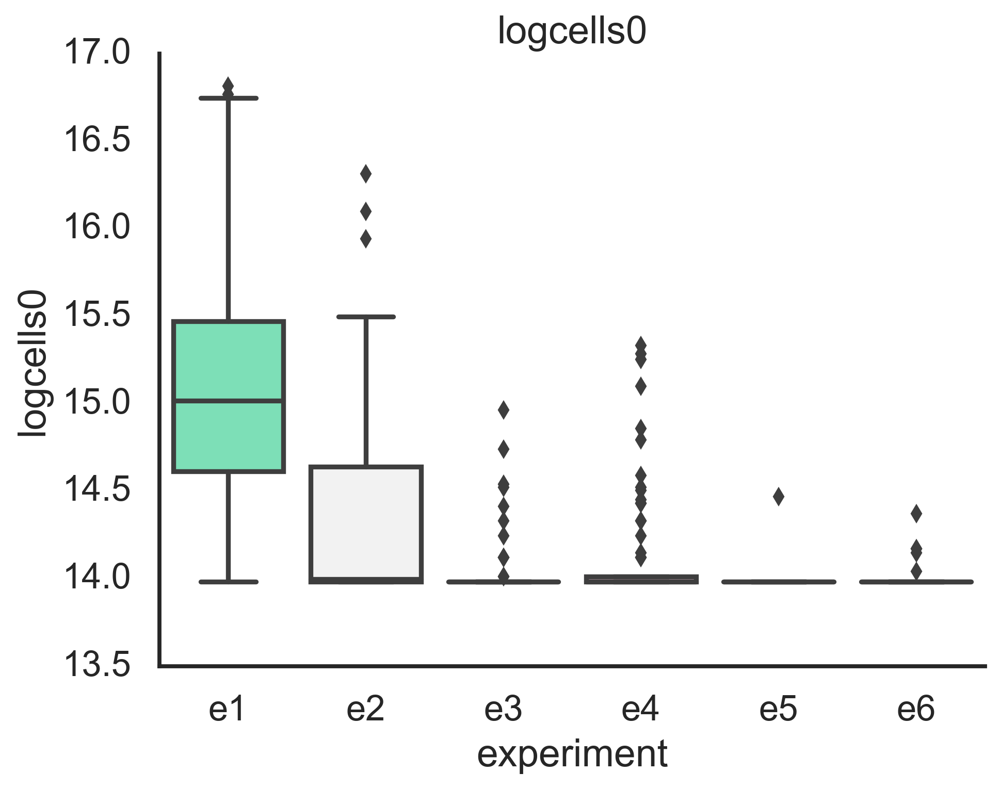

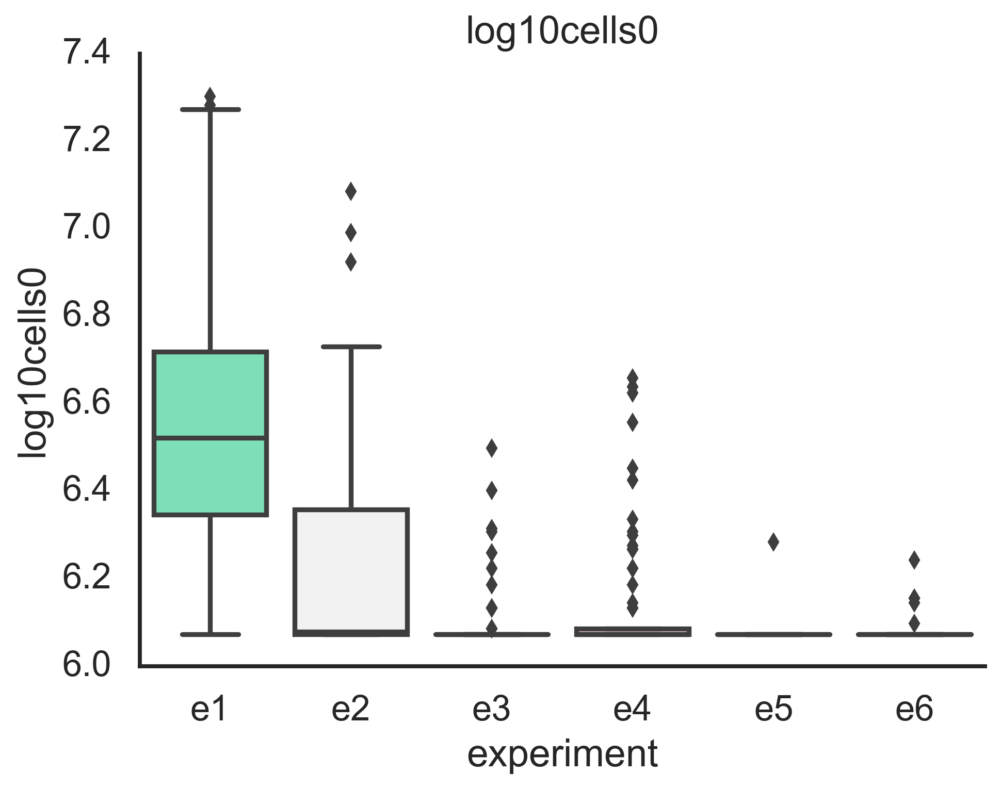

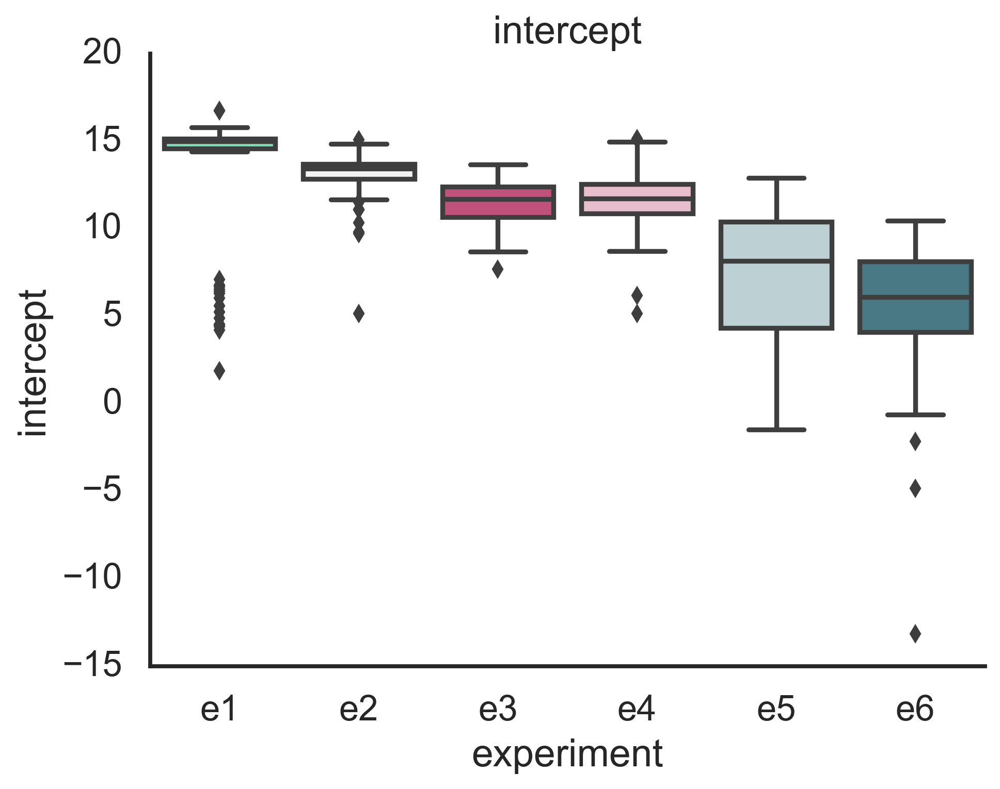

...

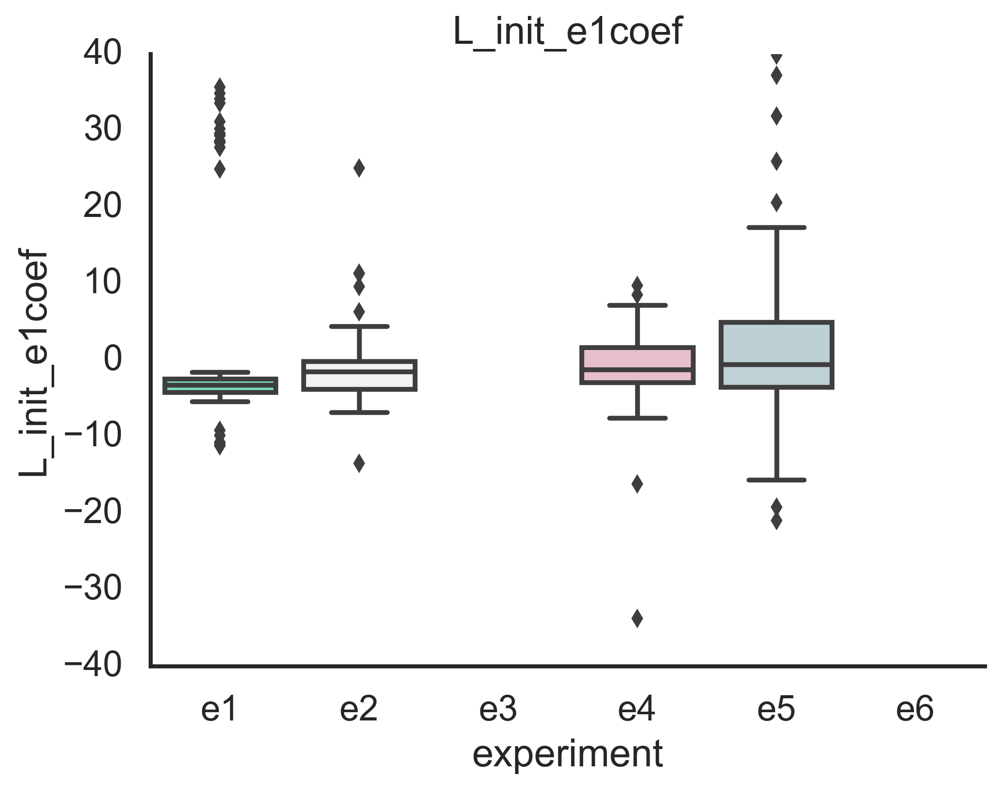

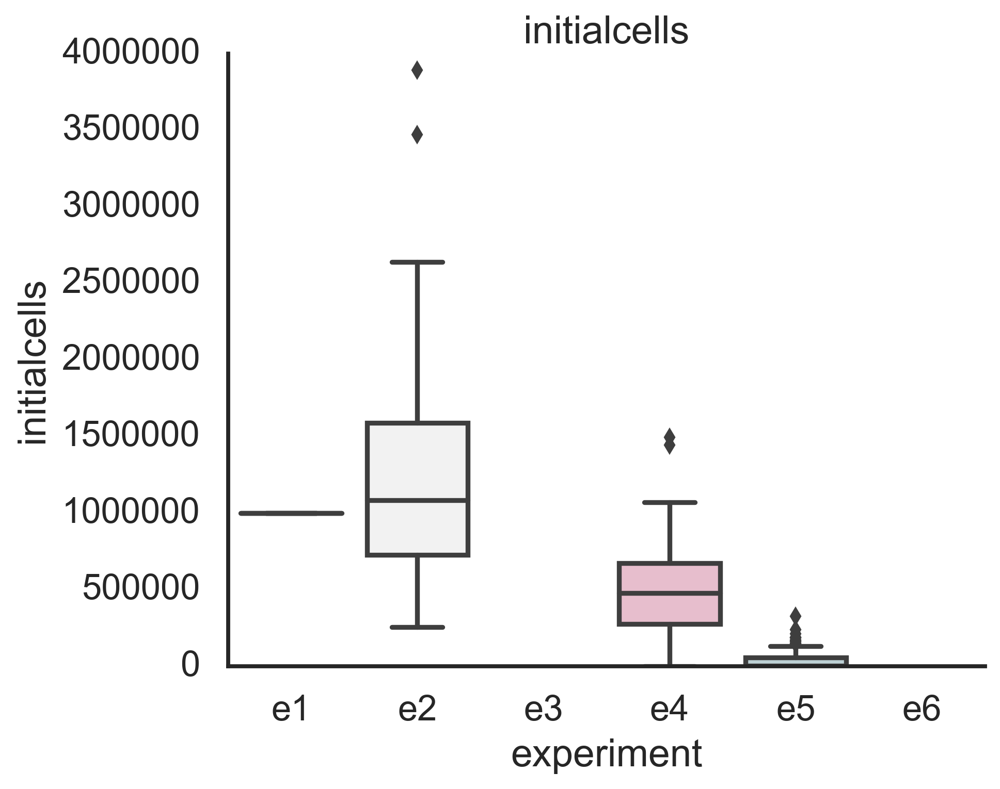

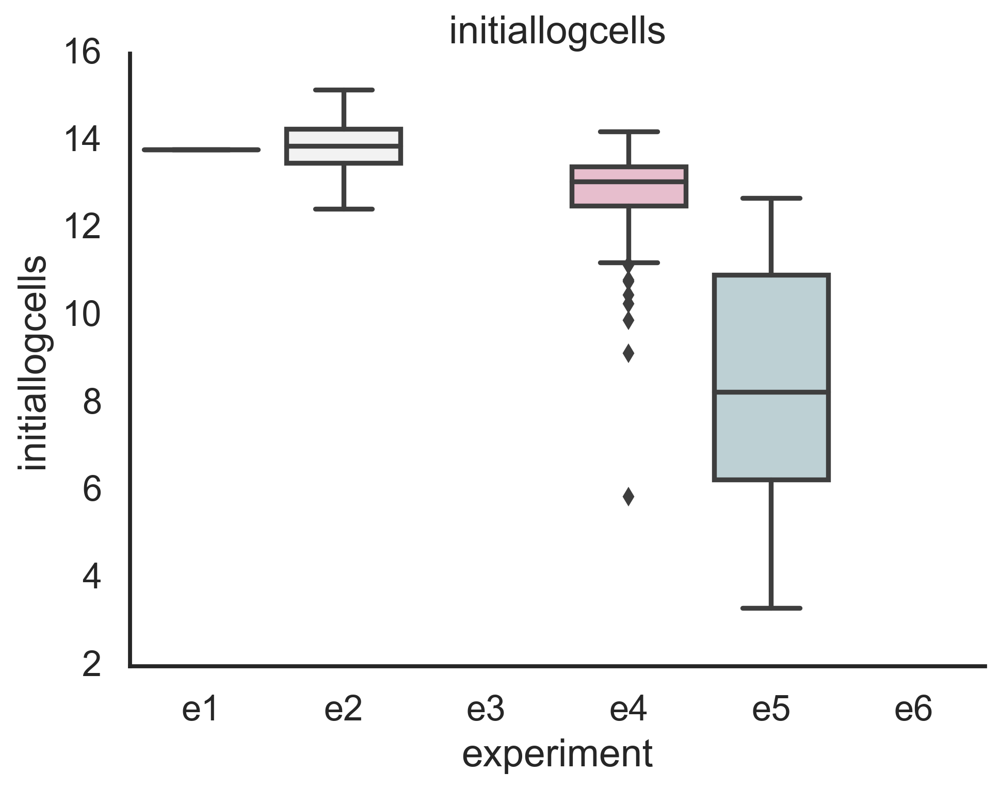

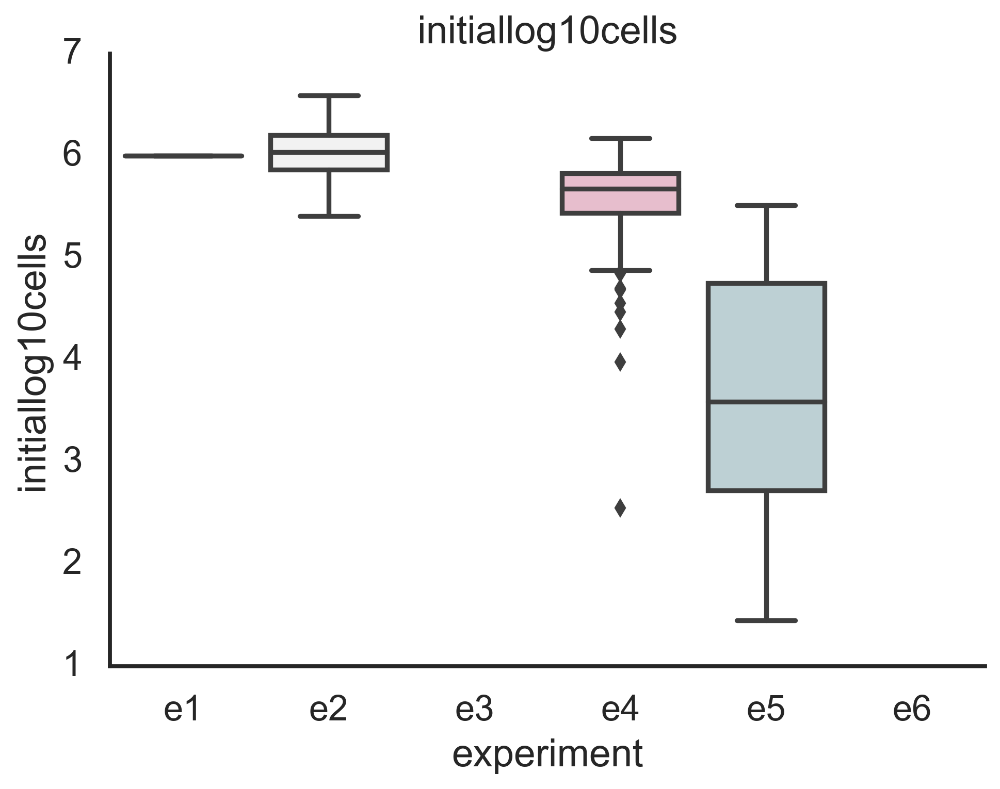

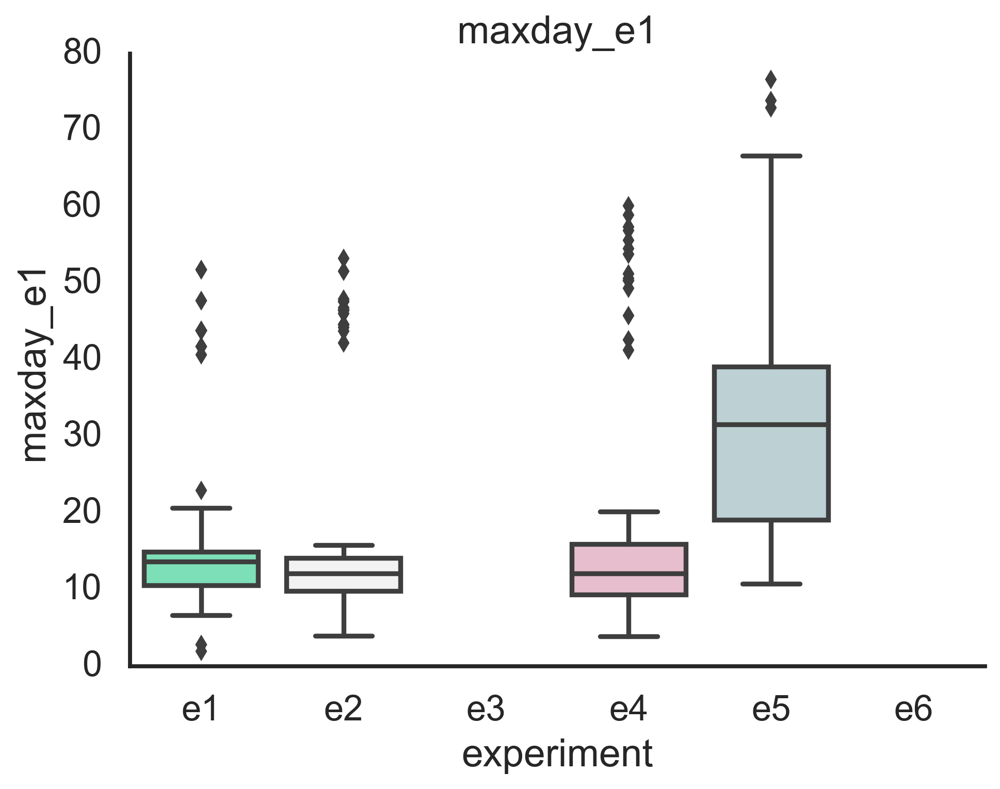

In [47]:
for i in ['maxday', 'maxlogcells', 'logcells0', 'log10cells0', 'intercept', 'coef', 'r2', 'L', 
          'L_init', 'e1 coef','L_init_e1coef', 'initialcells', 'initiallogcells',
       'initiallog10cells', 'maxday_e1']:
    sns.catplot(data=lagsdf, x='experiment', y=i, kind='box', aspect=1.3,
               order=eallorder, palette=eallpallete)
    plt.title(i)

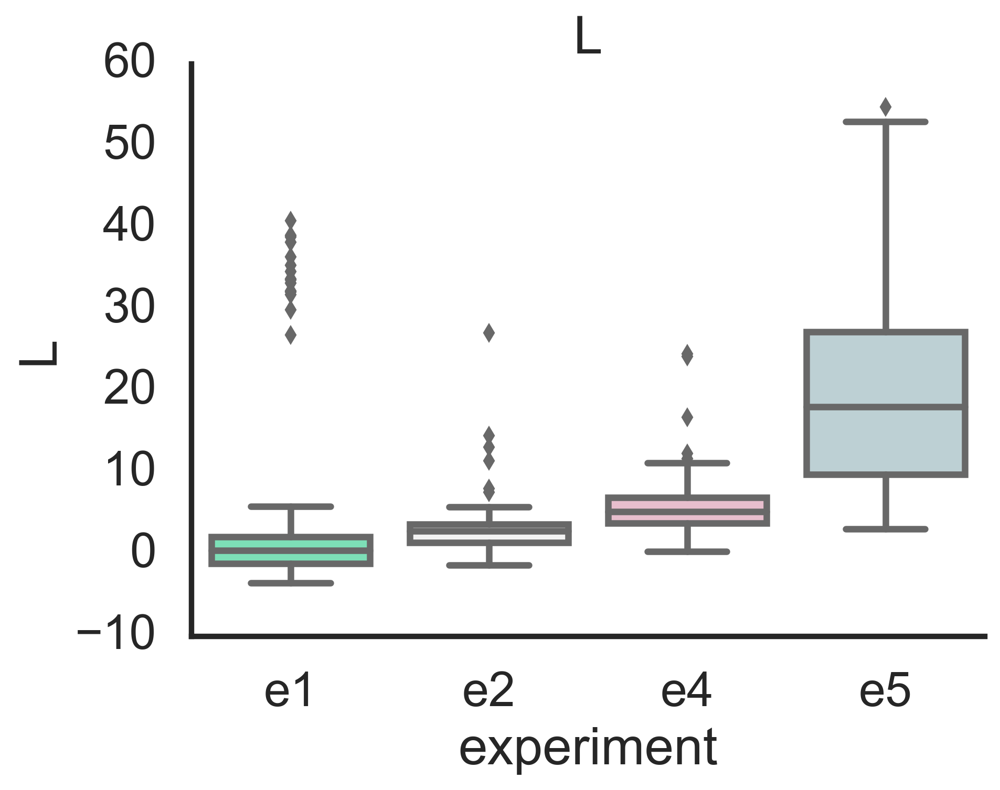

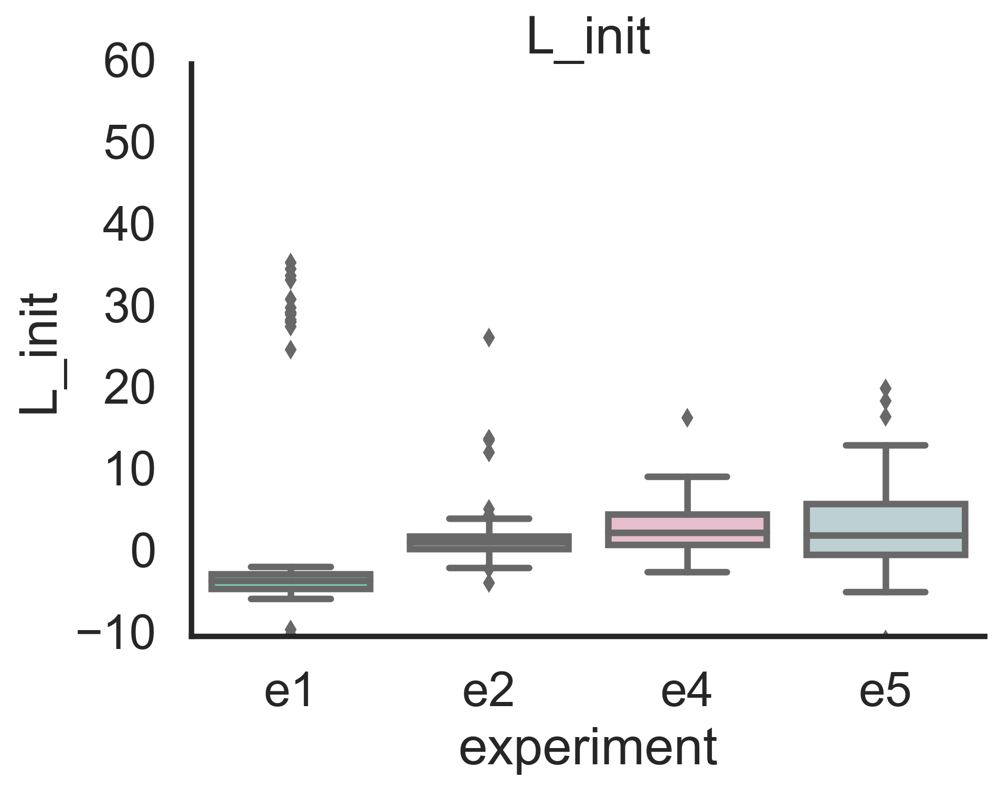

In [48]:
sns.set_style('white')
sns.set_context('poster')
for i in [#'maxday', 'maxlogcells', 'logcells0', 'log10cells0', 'intercept', 'coef', 'r2', 
    'L', 
          'L_init', #'e1 coef','L_init_e1coef', 'initialcells', 'initiallogcells',
       #'initiallog10cells', 'maxday_e1'
]:
    sns.catplot(data=lagsdf, x='experiment', y=i, kind='box', aspect=1.3, 
                order=efcmorder, palette=efcmpallete,
                facet_kws=dict(ylim=(-10,60))
                
               )
    plt.title(i)

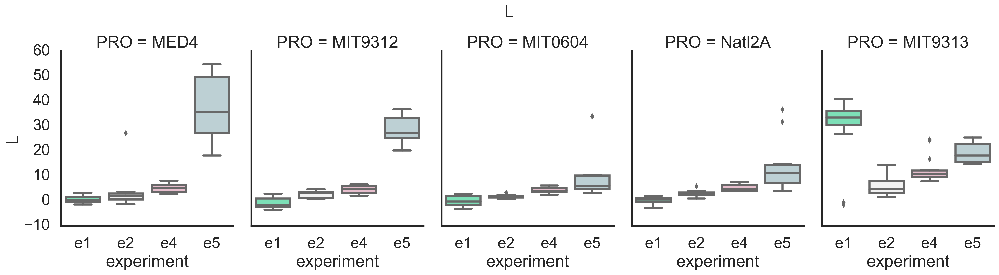

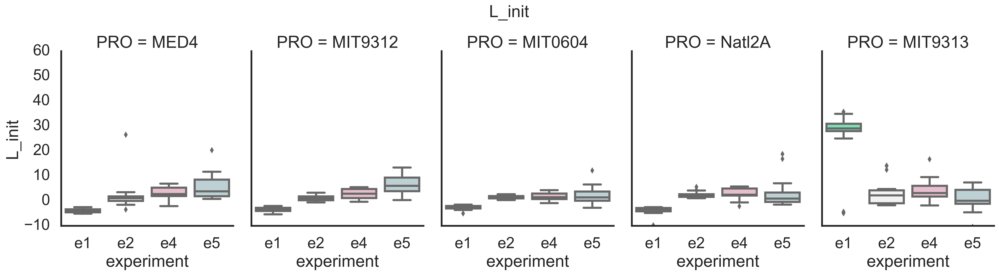

In [49]:
for i in [#'maxday', 'maxlogcells', 'logcells0', 'log10cells0', 'intercept', 'coef', 'r2',
    'L', 
          'L_init', #'e1 coef','L_init_e1coef', 'initialcells', 'initiallogcells',
       #'initiallog10cells', 'maxday_e1'
]:
    sns.catplot(data=lagsdf, x='experiment', y=i, kind='box', aspect=0.8, height=5,
                order=efcmorder,palette=efcmpallete,
                col='PRO', col_order=porder,
                facet_kws=dict(ylim=(-10,60))
               )
    plt.suptitle(i, y=1.05)

In [50]:
from statsmodels.formula.api import ols
for i in ['L', 'L_init', ]:
    for p in porder:
        mod = ols(f'{i} ~ C(experiment)',
                        data=lagsdf.loc[(lagsdf.PRO == p) & lagsdf.experiment.isin(efcmorder)]
                 ).fit()
        print(f'-------------------------- {i} {p} ----------------------------')
        print(mod.summary())
        print(sm.stats.anova_lm(mod))
        pair_t = mod.t_test_pairwise("C(experiment)", method='b')
        print(pair_t.result_frame)
        print(f'-------------------------- {i} {p} ----------------------------')
        print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
        #aov_table = sm.stats.anova_lm(mod, typ=2)
        #print(aov_table)

-------------------------- L MED4 ----------------------------
                            OLS Regression Results                            
Dep. Variable:                      L   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     72.60
Date:                Fri, 13 Nov 2020   Prob (F-statistic):           6.00e-19
Time:                        12:25:36   Log-Likelihood:                -190.46
No. Observations:                  58   AIC:                             388.9
Df Residuals:                      54   BIC:                             397.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                 df      sum_sq     mean_sq          F        PR(>F)
C(experiment)   3.0  794.463859  264.821286  48.910223  8.941619e-16
Residual       57.0  308.622868    5.414436        NaN           NaN
           coef   std err          t         P>|t|  Conf. Int. Low  \
e2-e1  4.677678  0.813489   5.750143  3.677046e-07        3.048694   
e4-e1  6.355535  0.813489   7.812686  1.407610e-10        4.726551   
e5-e1  9.938717  0.846934  11.734938  7.749251e-17        8.242761   
e4-e2  1.677857  0.849662   1.974735  5.314936e-02       -0.023561   
e5-e2  5.261039  0.881736   5.966686  1.630855e-07        3.495394   
e5-e4  3.583182  0.881736   4.063783  1.494991e-04        1.817537   

       Conf. Int. Upp.      pvalue-b  reject-b  
e2-e1         6.306662  2.206228e-06      True  
e4-e1         7.984519  8.445660e-10      True  
e5-e1        11.634673  4.649551e-16      True  
e4-e2         

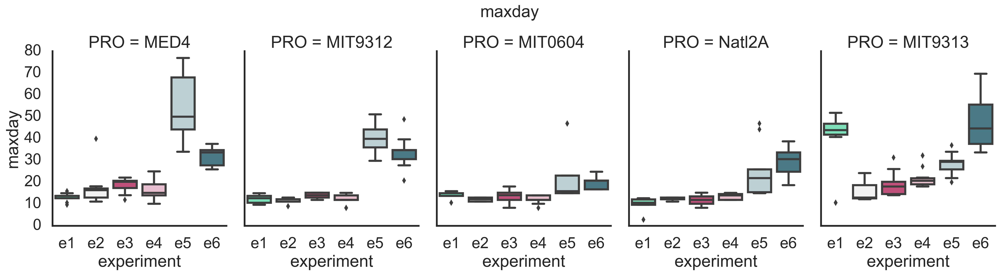

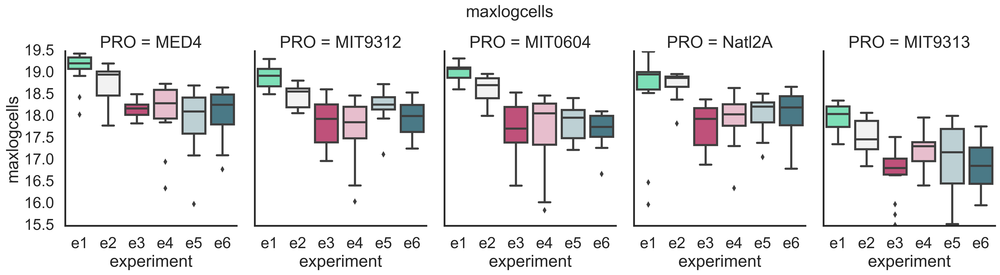

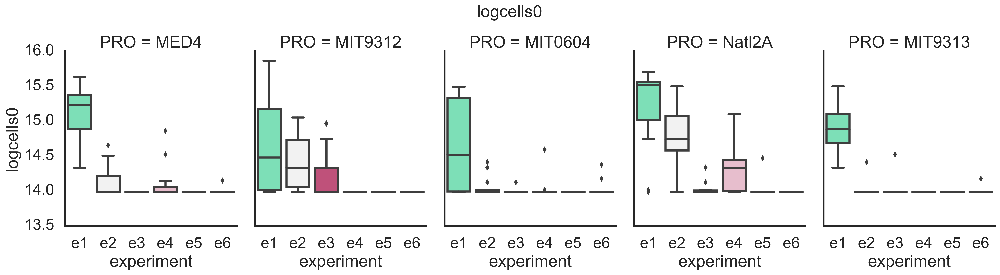

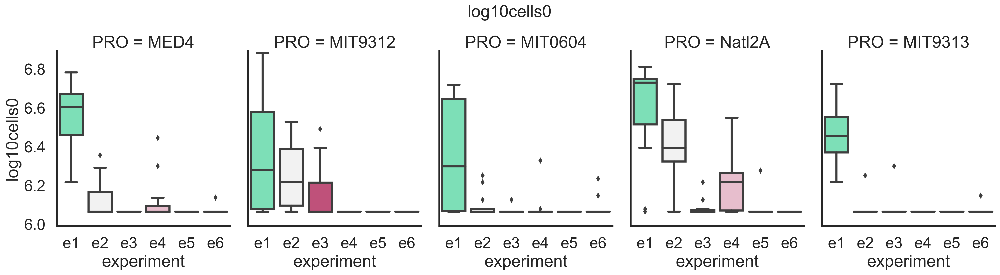

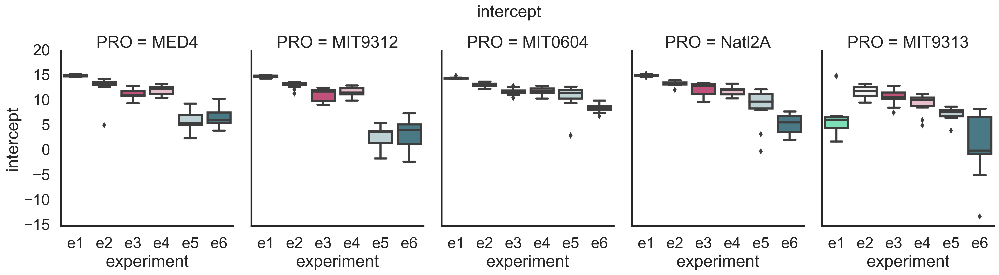

...

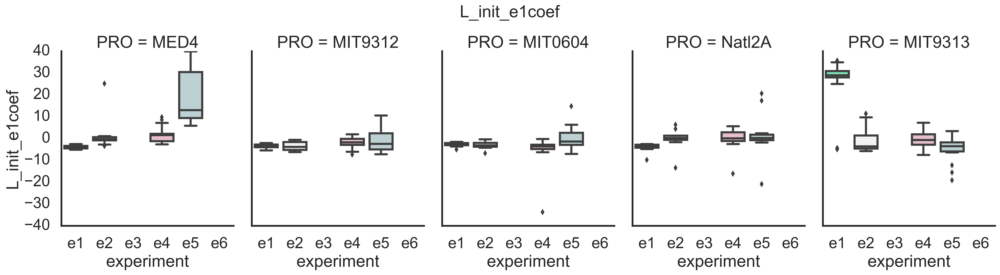

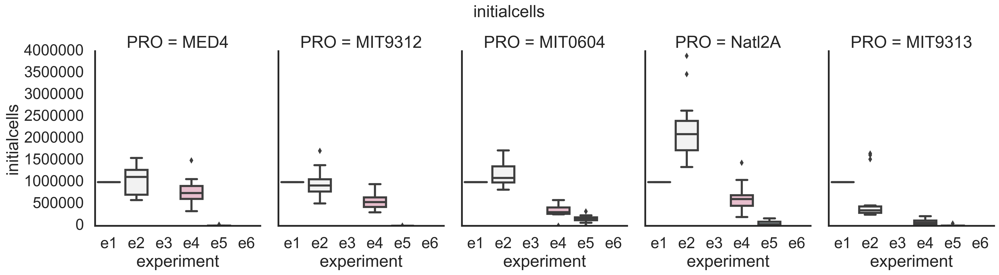

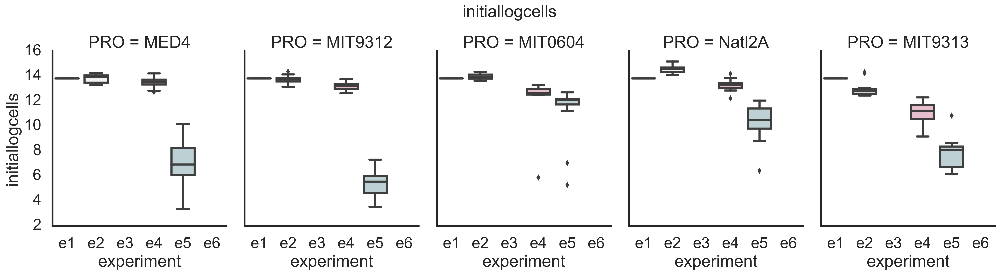

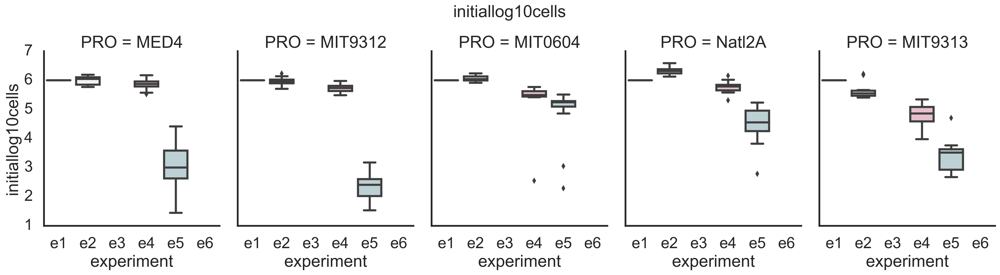

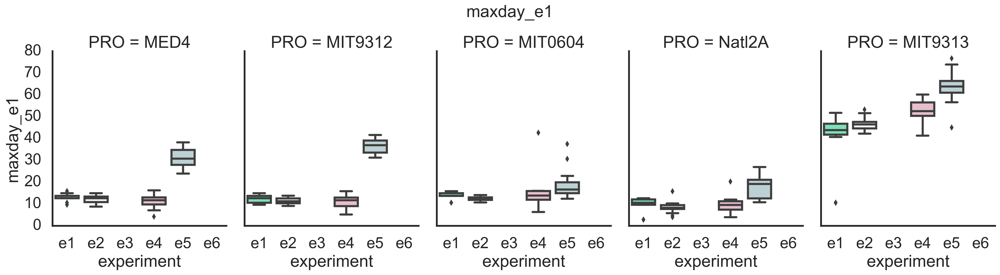

In [51]:
for i in ['maxday', 'maxlogcells', 'logcells0', 'log10cells0', 'intercept', 'coef', 'r2', 'L', 
          'L_init', 'e1 coef','L_init_e1coef', 'initialcells', 'initiallogcells',
       'initiallog10cells', 'maxday_e1']:
    sns.catplot(data=lagsdf, x='experiment', y=i, kind='box', aspect=0.8, height=5,
                order=eallorder,palette=eallpallete,
                
                col='PRO', col_order=porder)
    plt.suptitle(i, y=1.05)

In [52]:
from statsmodels.formula.api import ols
for p in porder:
    mod = ols('coef ~ C(experiment1)',
                    data=lagsdf.loc[lagsdf['culture'].isin(['Axenic', 'Co_Culture']) & (lagsdf.PRO == p)]

              
             ).fit()
    print(f'-------------------------- {p} ----------------------------')
    print(mod.summary())
    print(sm.stats.anova_lm(mod))
    pair_t = mod.t_test_pairwise("C(experiment1)", method='b')
    print(pair_t.result_frame)
    print(f'-------------------------- {p} ----------------------------')
    print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
    #aov_table = sm.stats.anova_lm(mod, typ=2)
    #print(aov_table)

-------------------------- MED4 ----------------------------
                            OLS Regression Results                            
Dep. Variable:                   coef   R-squared:                       0.401
Model:                            OLS   Adj. R-squared:                  0.355
Method:                 Least Squares   F-statistic:                     8.717
Date:                Fri, 13 Nov 2020   Prob (F-statistic):           2.90e-07
Time:                        12:25:58   Log-Likelihood:                 127.86
No. Observations:                  85   AIC:                            -241.7
Df Residuals:                      78   BIC:                            -224.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

In [53]:
maxdf.head()

,experiment,sample,PRO,ALT,culture,experiment_sample,FL,experiment1
0,e1,10A,MIT0604,DE,Co_Culture,"e1, 10A",5.621,1
1,e1,10B,MIT0604,DE,Co_Culture,"e1, 10B",5.660,1
2,e1,10C,MIT0604,DE,Co_Culture,"e1, 10C",5.704,1
3,e1,11A,MED4,DE1,Co_Culture,"e1, 11A",7.199,1
4,e1,11B,MED4,DE1,Co_Culture,"e1, 11B",7.116,1


In [54]:
from statsmodels.formula.api import ols
for p in porder:
    mod = ols('FL ~ C(experiment1)',
                    data=maxdf.loc[maxdf['culture'].isin(['Axenic', 'Co_Culture']) & (maxdf.PRO == p)]

              
             ).fit()
    print(f'-------------------------- {p} ----------------------------')
    print(mod.summary())
    print(sm.stats.anova_lm(mod))
    pair_t = mod.t_test_pairwise("C(experiment1)", method='b')
    print(pair_t.result_frame)
    print(f'-------------------------- {p} ----------------------------')
    print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
    #aov_table = sm.stats.anova_lm(mod, typ=2)
    #print(aov_table)

-------------------------- MED4 ----------------------------
                            OLS Regression Results                            
Dep. Variable:                     FL   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.740
Method:                 Least Squares   F-statistic:                     40.92
Date:                Fri, 13 Nov 2020   Prob (F-statistic):           3.85e-22
Time:                        12:25:58   Log-Likelihood:                -122.17
No. Observations:                  85   AIC:                             258.3
Df Residuals:                      78   BIC:                             275.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

Residual        78.0  12.000130  0.153848        NaN           NaN
          coef   std err         t         P>|t|  Conf. Int. Low  \
2-1  -0.412133  0.143224 -2.877549  5.167857e-03       -0.697270   
3-1  -1.028267  0.143224 -7.179442  3.581912e-10       -1.313403   
4-1  -0.925343  0.145759 -6.348449  1.328199e-08       -1.215526   
5-1  -0.812700  0.145759 -5.575647  3.410326e-07       -1.102884   
6-1  -1.144422  0.165381 -6.919933  1.118369e-09       -1.473670   
AX-1  0.324133  0.248071  1.306616  1.951826e-01       -0.169738   
3-2  -0.616133  0.143224 -4.301894  4.860057e-05       -0.901270   
4-2  -0.513210  0.145759 -3.520949  7.216521e-04       -0.803393   
5-2  -0.400567  0.145759 -2.748146  7.442315e-03       -0.690750   
6-2  -0.732289  0.165381 -4.427902  3.059416e-05       -1.061536   
AX-2  0.736267  0.248071  2.967970  3.979544e-03        0.242396   
4-3   0.102924  0.145759  0.706124  4.822150e-01       -0.187260   
5-3   0.215567  0.145759  1.478926  1.431873e-01 

In [55]:
lagsdf.head()

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,...,L,initialcells,initiallogcells,initiallog10cells,L_init,e1 coef,e1 L_init,L_init_e1coef,maxday_e1,experiment1
0,e1,10A,MIT0604,DE,Co_Culture,"e1, 10A",13.694444,0.715972,19.037963,1.853882e+08,...,-1.586110,1000000.0,13.815511,6.0,-2.953302,0.313703,-2.953302,-2.953302,13.694444,e1
1,e1,10B,MIT0604,DE,Co_Culture,"e1, 10B",14.960417,0.715972,19.107290,1.986966e+08,...,-1.248146,1000000.0,13.815511,6.0,-1.877449,0.314278,-1.877449,-1.877449,14.960417,e1
2,e1,10C,MIT0604,DE,Co_Culture,"e1, 10C",14.960417,0.000000,19.115056,2.002457e+08,...,-0.283185,1000000.0,13.815511,6.0,-2.076330,0.311066,-2.076330,-2.076330,14.960417,e1
3,e1,11A,MED4,DE1,Co_Culture,"e1, 11A",10.603472,0.000000,18.447188,1.026862e+08,...,1.551911,1000000.0,13.815511,6.0,-3.026942,0.339805,-3.026942,-3.026942,10.603472,e1
4,e1,11B,MED4,DE1,Co_Culture,"e1, 11B",13.694444,0.000000,19.184498,2.146455e+08,...,1.824440,1000000.0,13.815511,6.0,-4.009267,0.303269,-4.009267,-4.009267,13.694444,e1


In [56]:
lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic']), ['maxday', 'maxday_e1', 'PRO', 
            'experiment']].PRO.value_counts()

Natl2A     92
MIT9312    89
MIT9313    85
MED4       85
MIT0604    78
Name: PRO, dtype: int64

In [57]:
import matplotlib
matplotlib.__version__ 


'3.3.2'

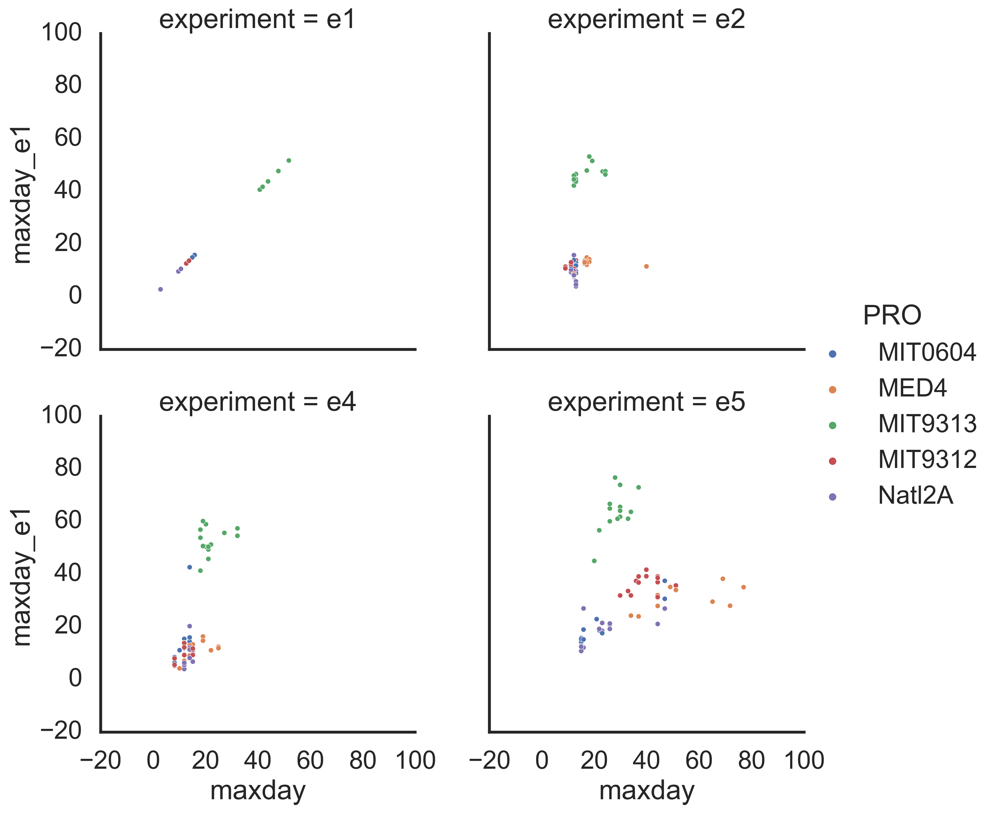

In [58]:
#for e in ['e1', 'e2', 'e4', 'e5']: 
g = sns.relplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='maxday', y='maxday_e1', hue='PRO', 
            col='experiment', col_wrap=2, col_order=['e1', 'e2', 'e4', 'e5'], 
                #palette=ppallete, hue_order=porder,
                #style='PRO', style_order=porder, markers=pmarkers,
                #size='PRO', size_order=porder, sizes=psizes,
                #facet_kws=dict(ylim=(0,80), xlim=(0,80))
            )
#g.map(sns.lineplot, x=lagsdf['maxday'], y=lagsdf['maxday'], linestyle='dashed' )
#g.set_axis_labels('actual max day', 'computed max day')


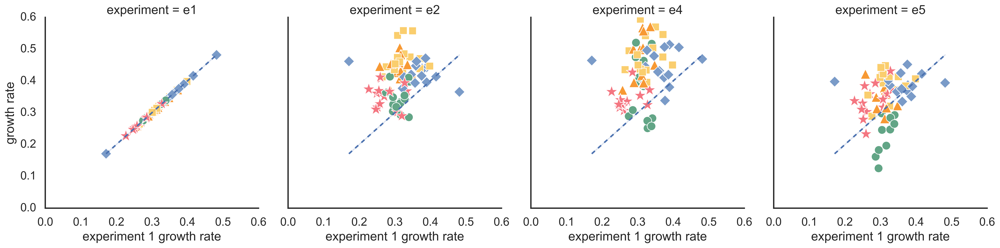

In [59]:
#for e in ['e1', 'e2', 'e4', 'e5']: 
sns.set_context('talk')
sns.set_style('white')
g = sns.relplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='e1 coef', y='coef', hue='PRO', 
            col='experiment', #col_wrap=2,
                col_order=['e1', 'e2', 'e4', 'e5'], 
                palette=ppallete, hue_order=porder,
                style='PRO', style_order=porder, markers=pmarkers,
                size='PRO', size_order=porder, sizes=psizes,
                facet_kws=dict(ylim=(0,0.6), xlim=(0,0.6)),
                legend=False
                
            )
g.map(sns.lineplot, x=lagsdf['e1 coef'], y=lagsdf['e1 coef'], linestyle='dashed' )
g.set_axis_labels('experiment 1 growth rate', 'growth rate')
#plt.legend(False)

In [60]:
lagsdf.columns

Index(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample',
       'maxday', 'minday', 'maxlogcells', 'maxcells', 'logcells0',
       'log10cells0', 'intercept', 'coef', 'r2', 'L', 'initialcells',
       'initiallogcells', 'initiallog10cells', 'L_init', 'e1 coef',
       'e1 L_init', 'L_init_e1coef', 'maxday_e1', 'experiment1'],
      dtype='object')

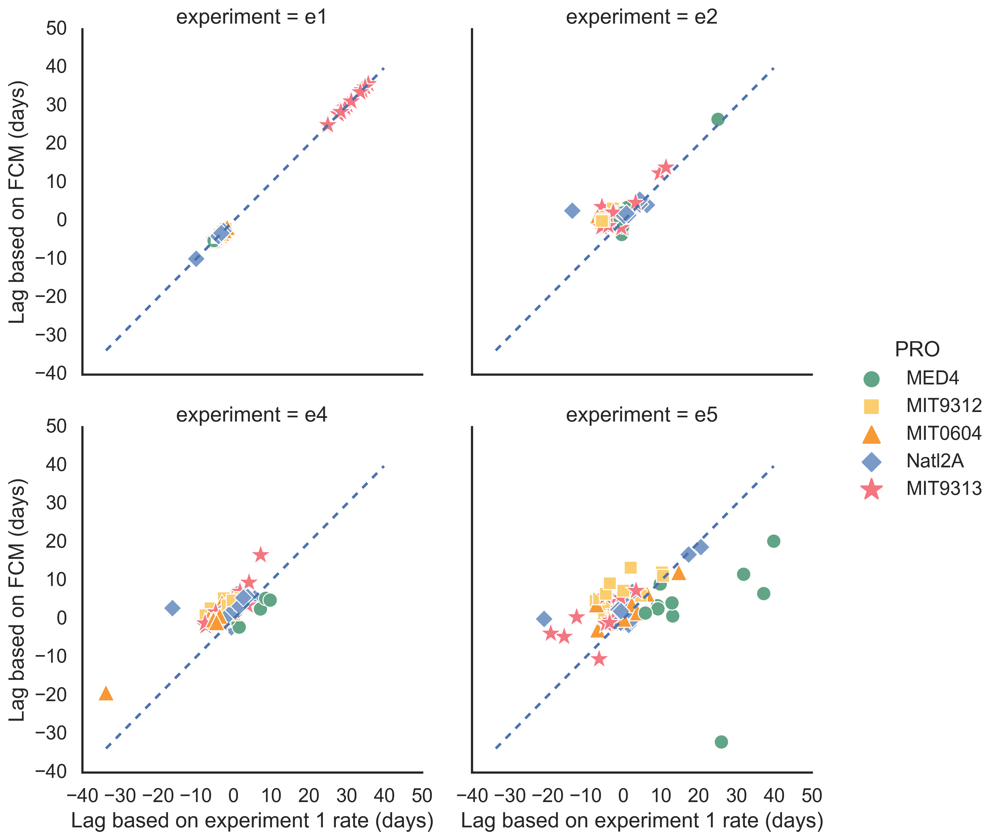

In [61]:
#for e in ['e1', 'e2', 'e4', 'e5']: 
g = sns.relplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='L_init_e1coef', y='L_init', hue='PRO', 
            col='experiment', col_wrap=2, col_order=['e1', 'e2', 'e4', 'e5'], 
                palette=ppallete, hue_order=porder,
                style='PRO', style_order=porder, markers=pmarkers,
                size='PRO', size_order=porder, sizes=psizes,
                #facet_kws=dict(ylim=(0,0.6), xlim=(0,0.6))
            )
g.map(sns.lineplot, x=lagsdf['L_init_e1coef'], y=lagsdf['L_init_e1coef'], linestyle='dashed' )
g.set_axis_labels('Lag based on experiment 1 rate (days)', 'Lag based on FCM (days)')


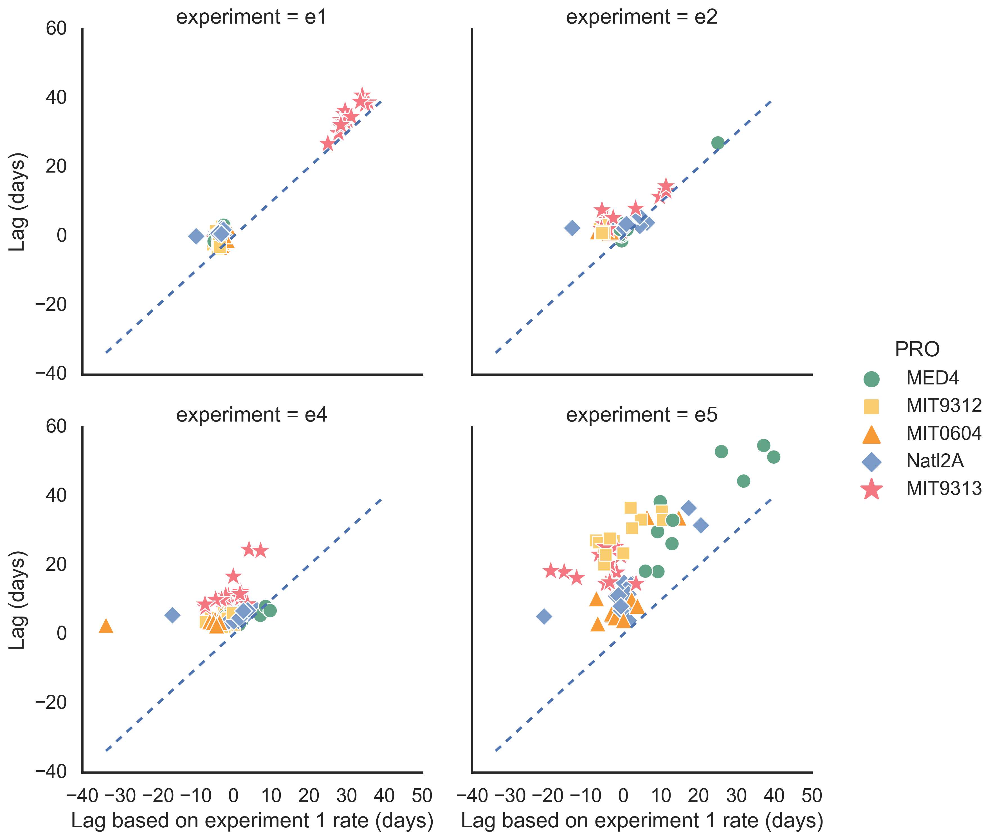

In [62]:
#for e in ['e1', 'e2', 'e4', 'e5']: 
g = sns.relplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='L_init_e1coef', y='L', hue='PRO', 
            col='experiment', col_wrap=2, col_order=['e1', 'e2', 'e4', 'e5'], 
                palette=ppallete, hue_order=porder,
                style='PRO', style_order=porder, markers=pmarkers,
                size='PRO', size_order=porder, sizes=psizes,
                #facet_kws=dict(ylim=(0,0.6), xlim=(0,0.6))
            )
g.map(sns.lineplot, x=lagsdf['L_init_e1coef'], y=lagsdf['L_init_e1coef'], linestyle='dashed' )
g.set_axis_labels('Lag based on experiment 1 rate (days)', 'Lag (days)')


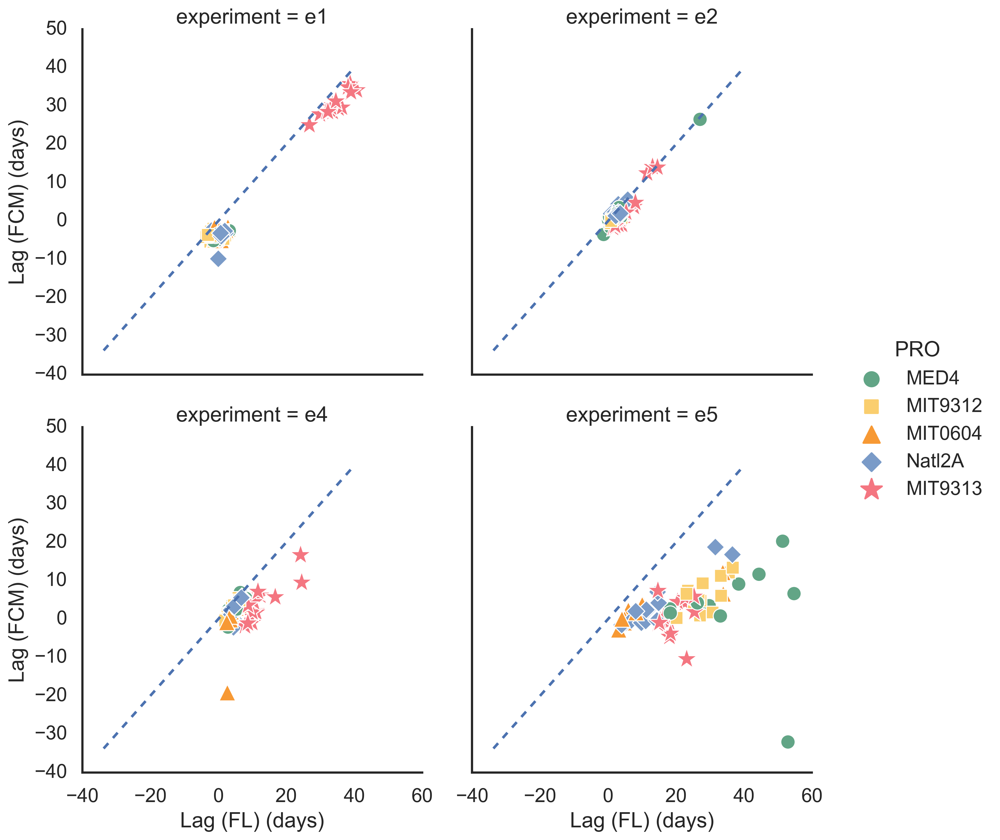

In [63]:
#for e in ['e1', 'e2', 'e4', 'e5']: 
g = sns.relplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='L', y='L_init', hue='PRO', 
            col='experiment', col_wrap=2, col_order=['e1', 'e2', 'e4', 'e5'], 
                palette=ppallete, hue_order=porder,
                style='PRO', style_order=porder, markers=pmarkers,
                size='PRO', size_order=porder, sizes=psizes,
                #facet_kws=dict(ylim=(0,0.6), xlim=(0,0.6))
            )
g.map(sns.lineplot, x=lagsdf['L_init_e1coef'], y=lagsdf['L_init_e1coef'], linestyle='dashed' )
g.set_axis_labels('Lag (FL) (days)', 'Lag (FCM) (days)')


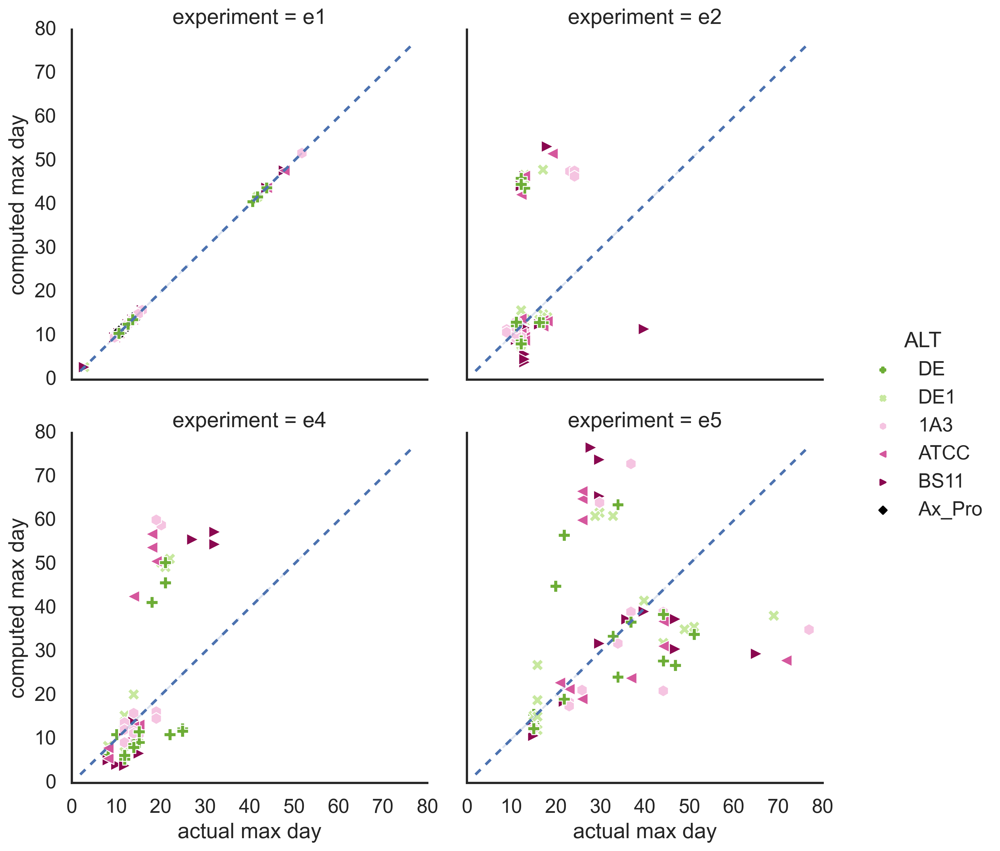

In [64]:
#for e in ['e1', 'e2', 'e4', 'e5']: 
g = sns.relplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='maxday', y='maxday_e1', hue='ALT', 
            col='experiment', col_wrap=2, col_order=['e1', 'e2', 'e4', 'e5'], 
                palette=apallete + ['black'], hue_order=aorder + ['Ax_Pro'],
                s=100,
                style='ALT', style_order=aorder+ ['Ax_Pro'], markers=amarkers + ['D'],
                facet_kws=dict(ylim=(0,80), xlim=(0,80))
            )
g.map(sns.lineplot, x=lagsdf['maxday'], y=lagsdf['maxday'], linestyle='dashed' )
g.set_axis_labels('actual max day', 'computed max day')


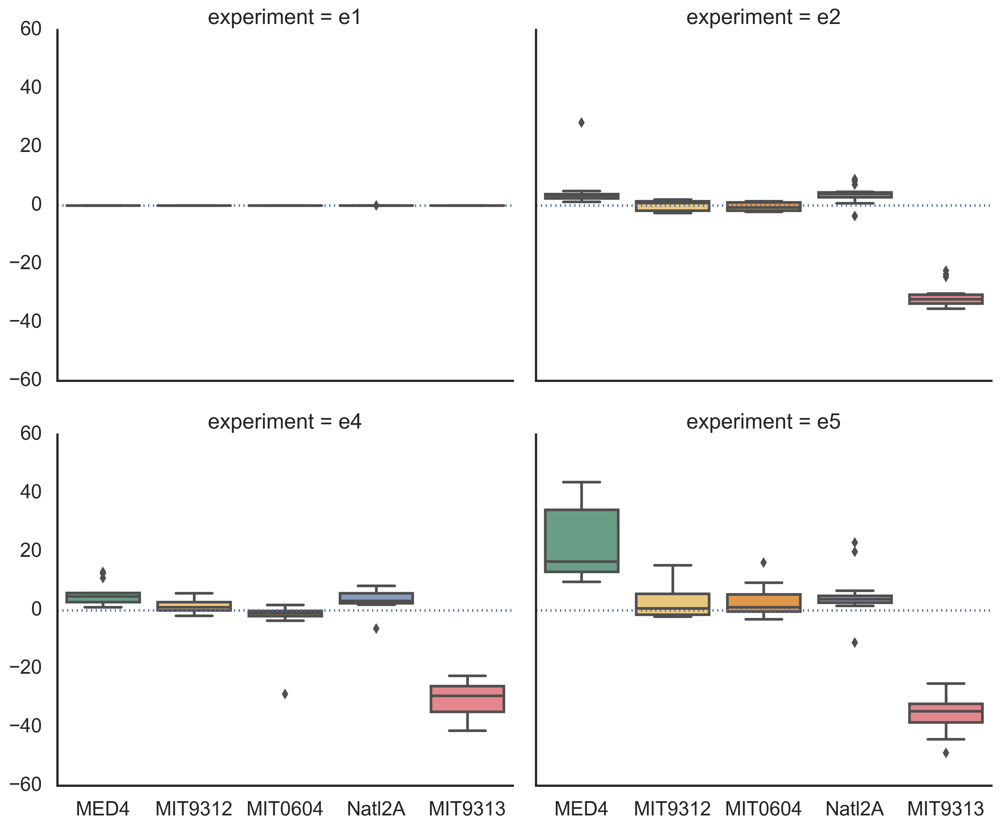

In [65]:
lagsdf['max day diff (actual - computed)'] = lagsdf['maxday'] - lagsdf['maxday_e1']
g = sns.catplot(data=lagsdf.loc[lagsdf.culture.isin(['Co_Culture', 'Axenic'])], 
                                x='PRO', y='max day diff (actual - computed)', #hue='PRO', 
            col='experiment', col_wrap=2, col_order=['e1', 'e2', 'e4', 'e5'], 
                palette=ppallete, order=porder,
                aspect=1.2,
                #style='PRO', style_order=porder, markers=pmarkers,
                #size='PRO', size_order=porder, sizes=psizes,
                #facet_kws=dict(ylim=(0,80))
                kind='box',
            )
def plot_axhline0(**kwargs):
    plt.axhline(0,**kwargs)
g.map(plot_axhline0, ls=':')


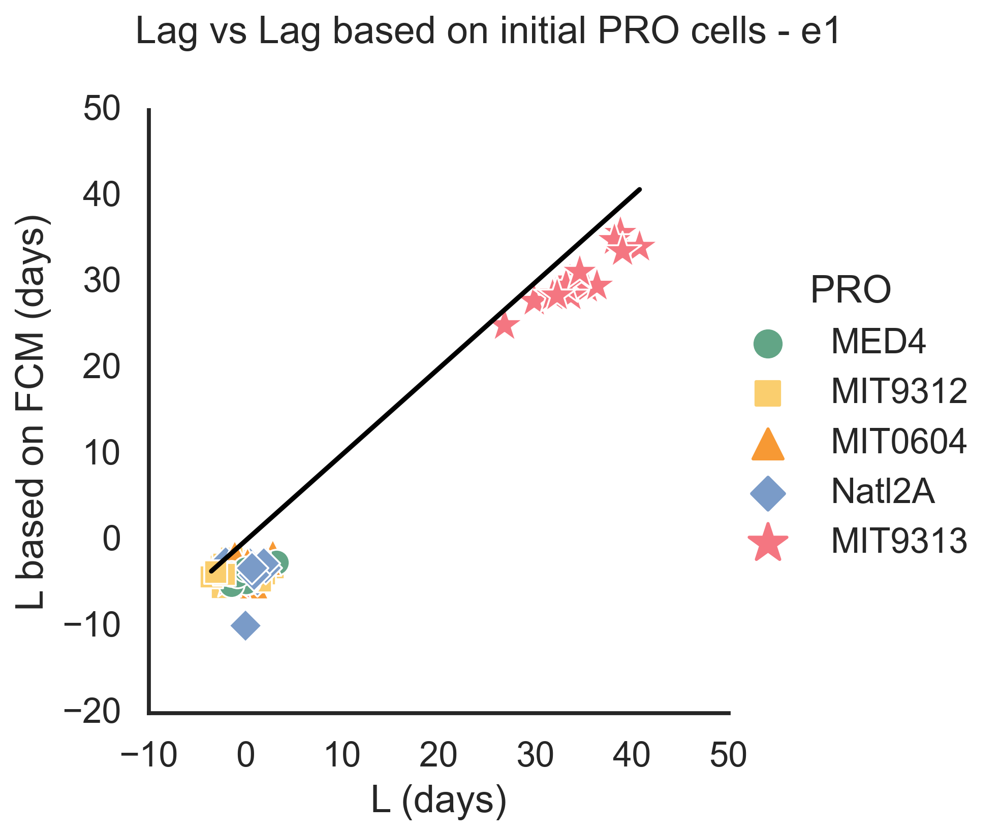

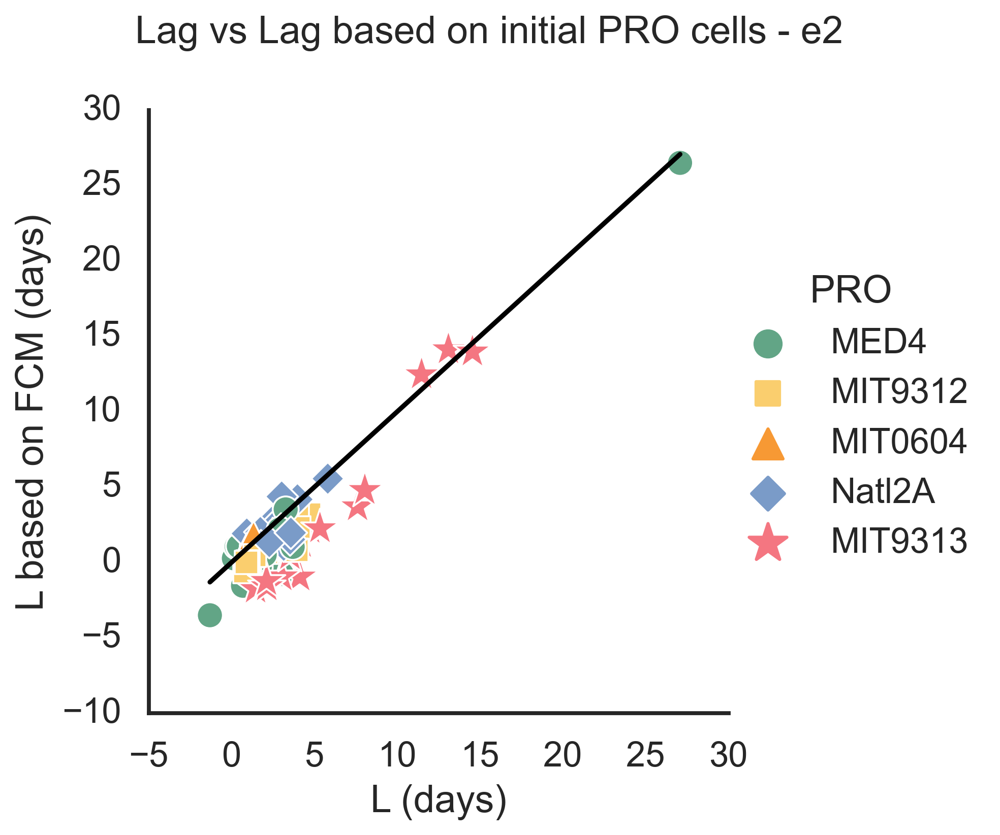

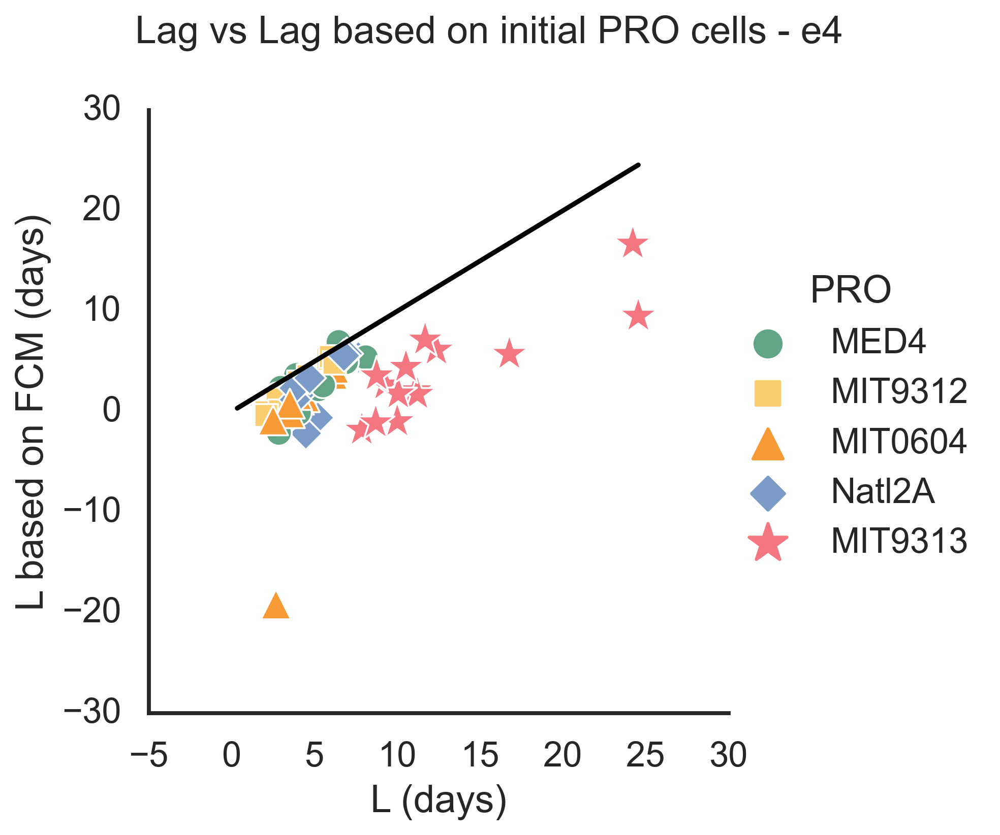

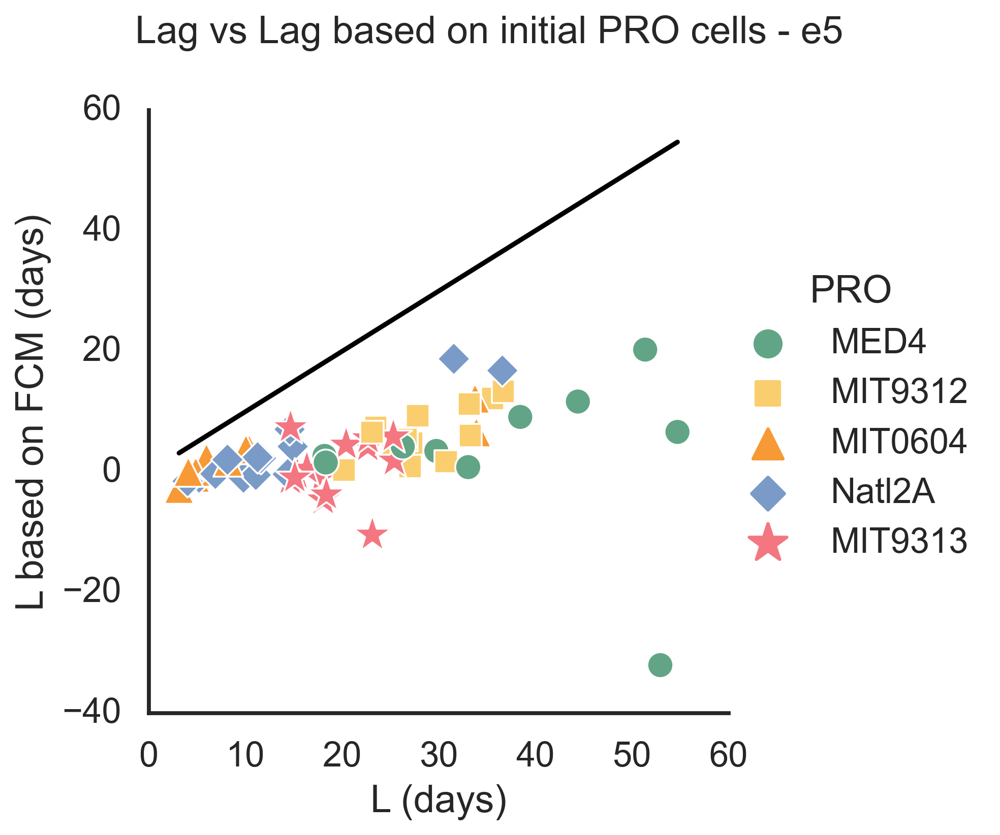

In [66]:
sns.set_context('talk')
sns.set_style('white')
for e in ['e1','e2','e4','e5']:
    g = sns.relplot(data=lagsdf.loc[lagsdf.experiment.isin([e]) & lagsdf.PRO.isin(porder)], 
            x='L', y='L_init',  hue='PRO', s=50, #legend=False,
                    hue_order=porder, palette=ppallete,
                    style='PRO', style_order=porder, markers=pmarkers,
                    size='PRO', size_order=porder, sizes=psizes,
                   )
    sns.lineplot(x=lagsdf.loc[lagsdf.experiment.isin([e]),'L'], 
                 y=lagsdf.loc[lagsdf.experiment.isin([e]),'L'], color='black', ax=g.ax, legend=False )
    g.set_axis_labels('L (days)', 'L based on FCM (days)')
    plt.suptitle(f'Lag vs Lag based on initial PRO cells - {e}', y=1.05)

In [67]:
lagsdf.columns

Index(['experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample',
       'maxday', 'minday', 'maxlogcells', 'maxcells', 'logcells0',
       'log10cells0', 'intercept', 'coef', 'r2', 'L', 'initialcells',
       'initiallogcells', 'initiallog10cells', 'L_init', 'e1 coef',
       'e1 L_init', 'L_init_e1coef', 'maxday_e1', 'experiment1',
       'max day diff (actual - computed)'],
      dtype='object')

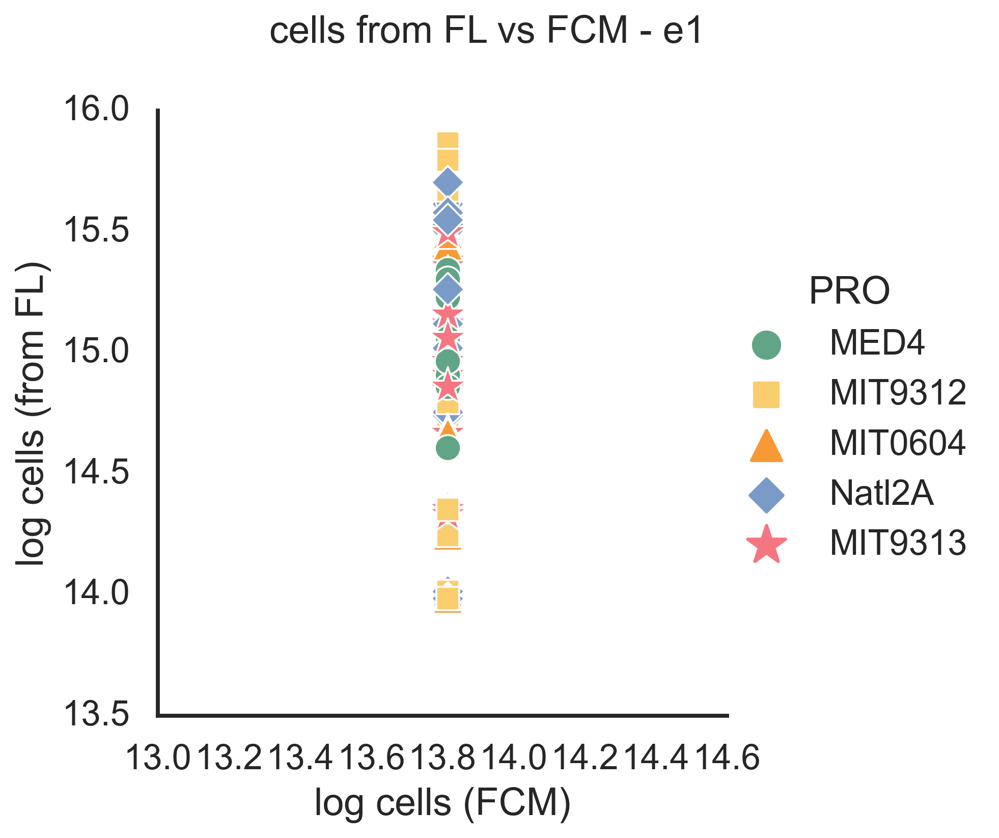

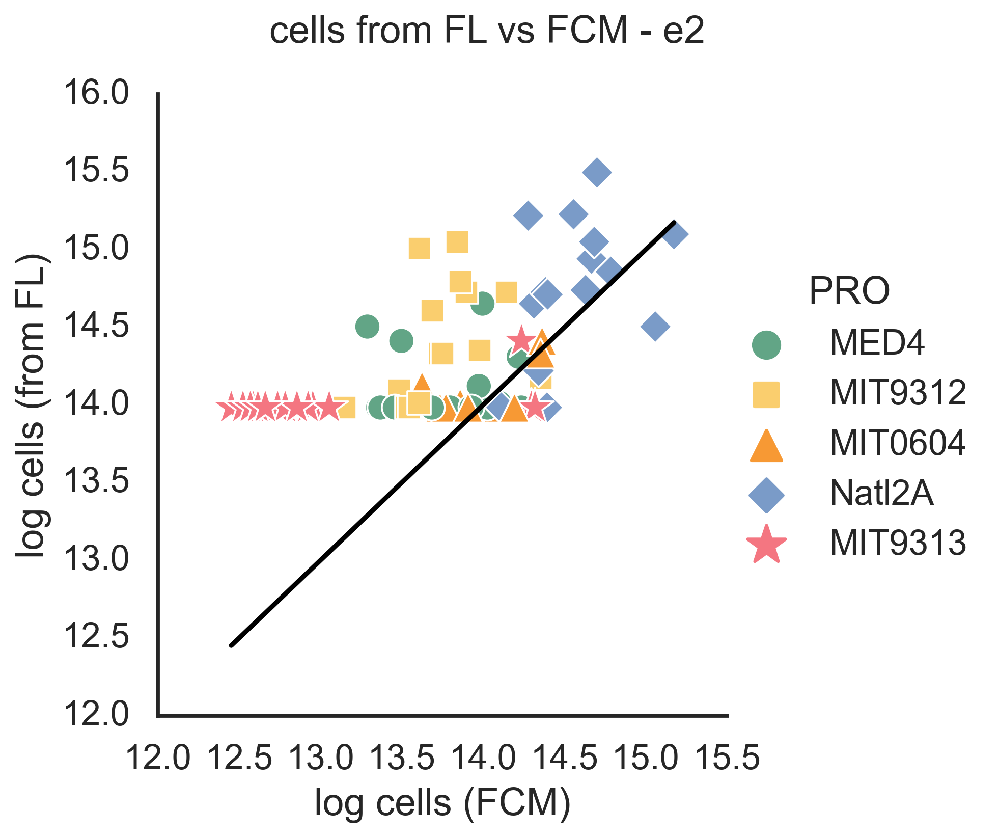

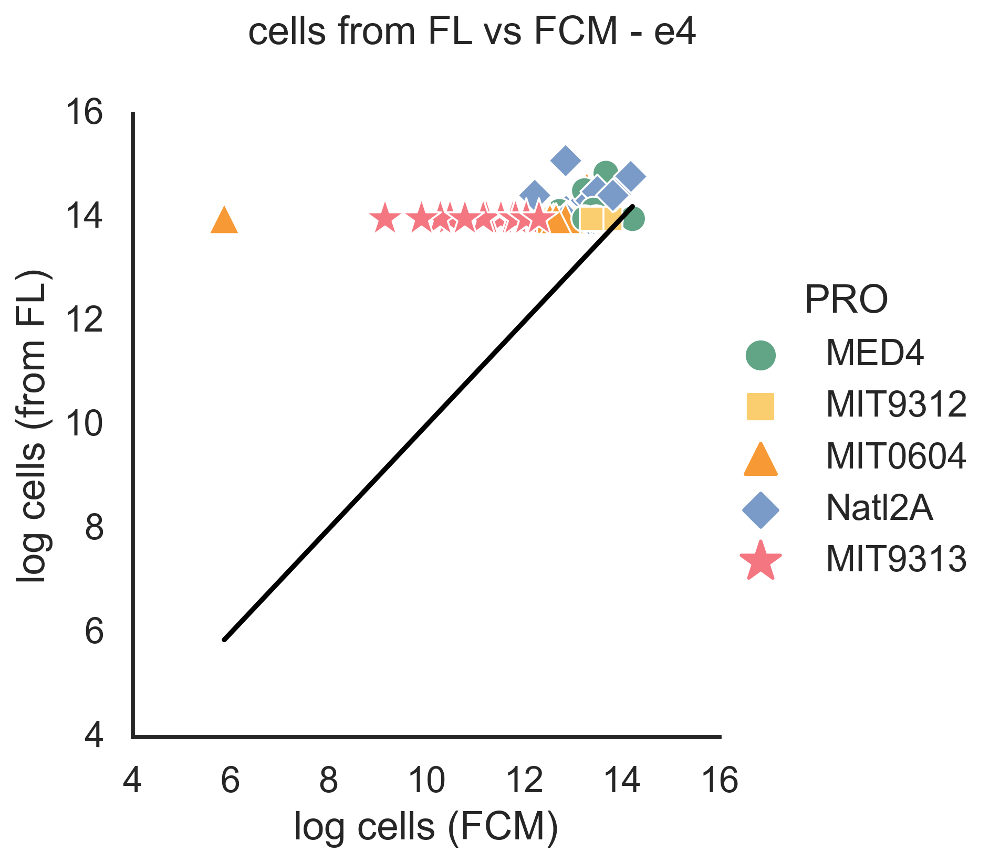

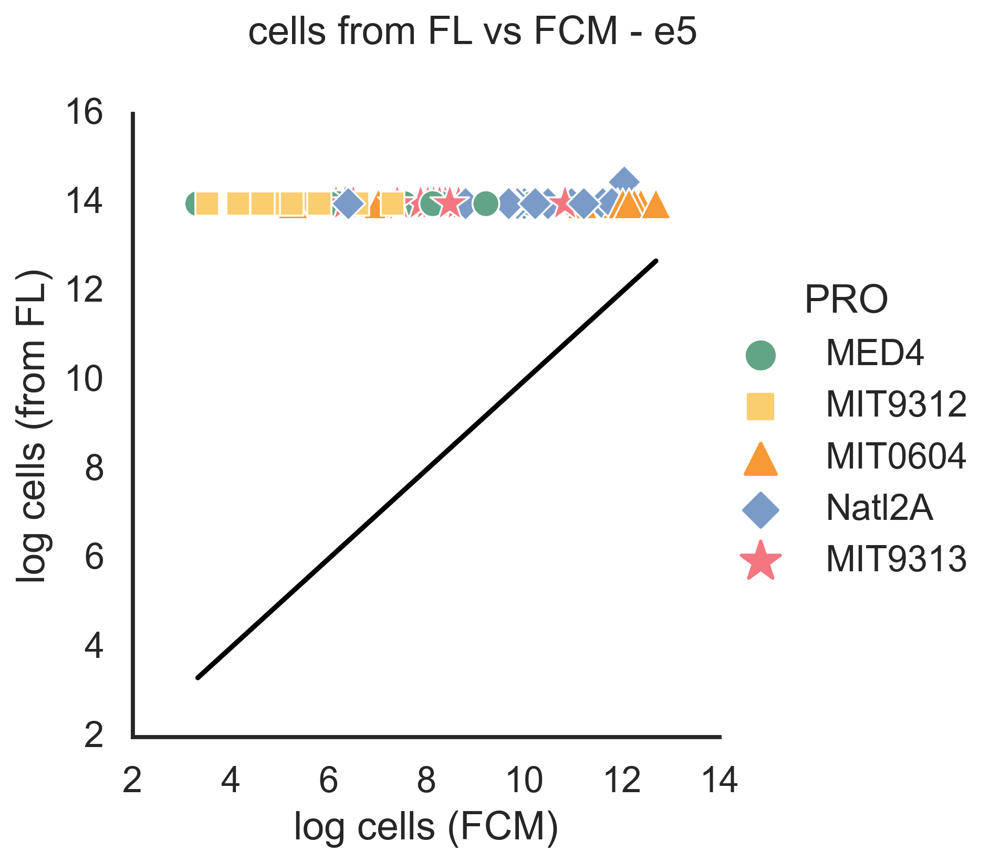

In [68]:
sns.set_context('talk')
sns.set_style('white')
for e in ['e1','e2','e4','e5']:
    g = sns.relplot(data=lagsdf.loc[lagsdf.experiment.isin([e]) & lagsdf.PRO.isin(porder)], 
            y='logcells0', x='initiallogcells',  hue='PRO', s=50, #legend=False,
                    hue_order=porder, palette=ppallete,
                    style='PRO', style_order=porder, markers=pmarkers,
                    size='PRO', size_order=porder, sizes=psizes,
                   )
    sns.lineplot(x=lagsdf.loc[lagsdf.experiment.isin([e]),'initiallogcells'], 
                 y=lagsdf.loc[lagsdf.experiment.isin([e]),'initiallogcells'], color='black', ax=g.ax, legend=False )
    g.set_axis_labels('log cells (FCM)', 'log cells (from FL)', )
    plt.suptitle(f'cells from FL vs FCM - {e}', y=1.05)
    plt.ticklabel_format(useOffset=False)

In [69]:
worse_l = lagsdf.nsmallest(10, 'L')['experiment_sample']

In [70]:
lagsdf.nsmallest(10, 'r2')

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,...,initialcells,initiallogcells,initiallog10cells,L_init,e1 coef,e1 L_init,L_init_e1coef,maxday_e1,experiment1,max day diff (actual - computed)
41,e1,22C,MIT9313,ATCC,Co_Culture,"e1, 22C",43.836806,33.886111,17.742529,5.075540e+07,...,1.000000e+06,13.815511,6.000000,28.463938,0.255451,28.463938,28.463938,43.836806,e1,0.000000
6,e1,12A,MIT9313,DE1,Co_Culture,"e1, 12A",43.836806,33.886111,17.996596,6.543686e+07,...,1.000000e+06,13.815511,6.000000,27.847106,0.261486,27.847106,27.847106,43.836806,e1,0.000000
68,e1,37B,all,all,All_strains,"e1, 37B",20.660417,0.000000,19.498022,2.936860e+08,...,1.000000e+06,13.815511,6.000000,-9.183386,0.190408,-9.183386,-9.183386,20.660417,e1,0.000000
94,e2,11A,MED4,DE1,Co_Culture,"e2, 11A",16.310000,4.110000,19.021496,1.823604e+08,...,6.310714e+05,13.355174,5.800079,-3.503270,0.339805,-3.026942,-0.365233,13.648290,e2,2.661710
67,e1,37A,all,all,All_strains,"e1, 37A",22.951389,0.000000,19.674600,3.504050e+08,...,1.000000e+06,13.815511,6.000000,-10.697327,0.174125,-10.697327,-10.697327,22.951389,e1,0.000000
69,e1,37C,all,all,All_strains,"e1, 37C",16.952083,0.000000,19.441551,2.775610e+08,...,1.000000e+06,13.815511,6.000000,-10.776119,0.202900,-10.776119,-10.776119,16.952083,e1,0.000000
47,e1,24C,Natl2A,ATCC,Co_Culture,"e1, 24C",10.603472,0.000000,18.610670,1.209236e+08,...,1.000000e+06,13.815511,6.000000,-4.289072,0.321984,-4.289072,-4.289072,10.603472,e1,0.000000
140,e2,2A,MIT9313,1A3,Co_Culture,"e2, 2A",23.160000,12.990000,17.691294,4.822048e+07,...,1.618456e+06,14.296983,6.209101,12.461117,0.251595,34.118892,9.668818,47.610075,e2,-24.450075
58,e1,29C,MIT9313,Ax_Pro,Axenic,"e1, 29C",10.603472,0.000000,18.238225,8.332218e+07,...,1.000000e+06,13.815511,6.000000,-5.001191,0.283423,-5.001191,-5.001191,10.603472,Axenic,0.000000
52,e1,27C,Natl2A,Ax_Pro,Axenic,"e1, 27C",12.650694,0.000000,19.022075,1.824660e+08,...,1.000000e+06,13.815511,6.000000,-4.578011,0.302203,-4.578011,-4.578011,12.650694,Axenic,0.000000


In [71]:
def plot_growth(es):
    sns.set(rc={'figure.figsize':(10,5)})
    maxday = lagsdf.loc[lagsdf.experiment_sample == es, 'maxday'].unique()[0]
    minday = lagsdf.loc[lagsdf.experiment_sample == es, 'minday'].unique()[0]
    r2 = lagsdf.loc[lagsdf.experiment_sample == es, 'r2'].unique()[0]
    L = lagsdf.loc[lagsdf.experiment_sample == es, 'L'].unique()[0]
    
    d = df.loc[df.experiment_sample == es].reset_index()
    d['fitted_growth'] = d.day*lagsdf.loc[lagsdf.experiment_sample == es, 'coef'].unique() + lagsdf.loc[lagsdf.experiment_sample == es, 'intercept'].unique()
    d.loc[d.day > maxday, 'fitted_growth'] = np.NaN
    d.loc[d.day < minday, 'fitted_growth'] = np.NaN
    sns.lineplot(data=d,
                 x='day', y='logcells',  style=True, markers=True,label='logcells')
    sns.lineplot(data=d,
        x='day', y='fitted_growth',  style=True, markers=True,label='fit')
    plt.title(f'{es}: L={L:.2f}, r2={r2:.2f}')
    plt.show()


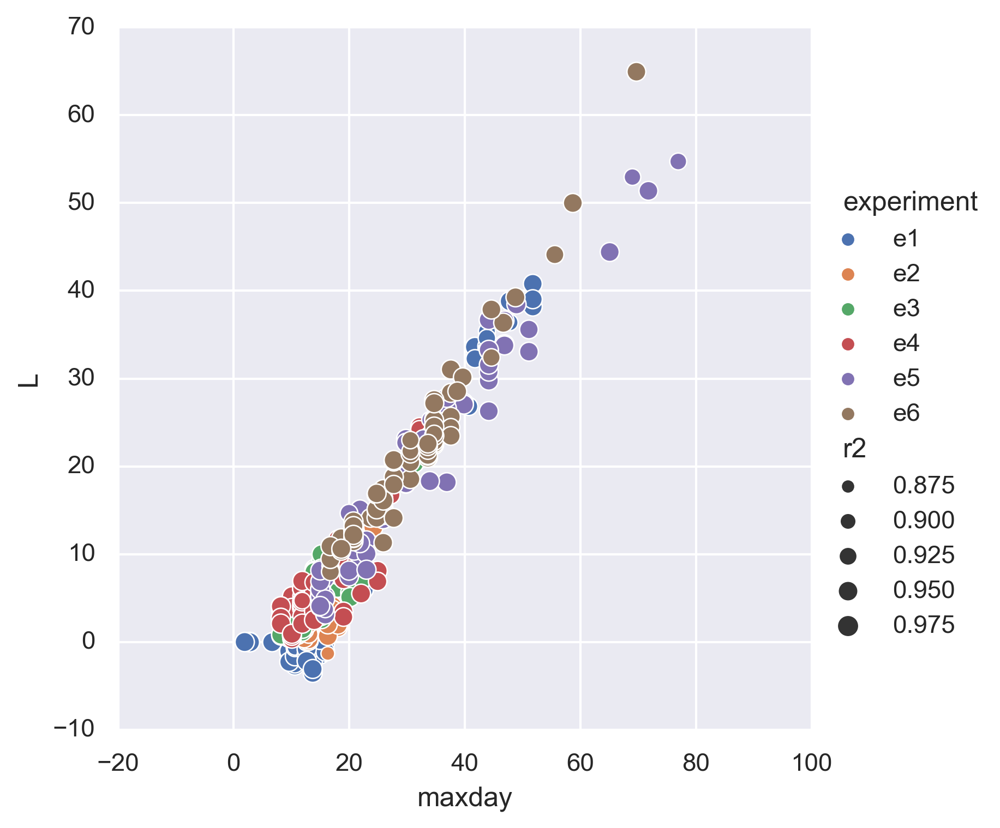

In [73]:
sns.relplot(data=lagsdf, x='maxday', y='L', hue='experiment', size='r2')

In [74]:
lagsdf.loc[lagsdf.maxday>60]

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,...,initialcells,initiallogcells,initiallog10cells,L_init,e1 coef,e1 L_init,L_init_e1coef,maxday_e1,experiment1,max day diff (actual - computed)
325,e5,11C,MED4,DE1,Co_Culture,"e5, 11C",69.01,61.86,15.996908,8.858681e+06,...,28.000000,3.332205,1.447158,-32.029757,0.294652,-4.753137,26.028038,38.228825,e5,30.781175
337,e5,16B,MED4,BS11,Co_Culture,"e5, 16B",65.08,48.95,18.045422,6.871114e+07,...,1900.538748,7.549893,3.278877,11.687548,0.316455,-3.640998,31.914038,29.524965,e5,35.555035
347,e5,1C,MED4,1A3,Co_Culture,"e5, 1C",76.94,61.86,17.578574,4.308020e+07,...,495.000000,6.204558,2.694605,6.647716,0.286468,-4.664295,37.235642,35.040063,e5,41.899937
350,e5,21B,MED4,ATCC,Co_Culture,"e5, 21B",71.78,54.95,17.714390,4.934711e+07,...,4023.207626,8.299835,3.604572,20.301099,0.295219,-3.913593,39.889960,27.976447,e5,43.803553
410,e6,17A,MIT9313,BS11,Co_Culture,"e6, 17A",69.70,62.70,15.972773,8.647437e+06,...,NaN,NaN,NaN,NaN,0.259382,29.363800,NaN,NaN,e6,NaN


In [75]:
def plot_growth(es):
    maxday = lagsdf.loc[lagsdf.experiment_sample == es, 'maxday'].unique()[0]
    minday = lagsdf.loc[lagsdf.experiment_sample == es, 'minday'].unique()[0]
    r2 = lagsdf.loc[lagsdf.experiment_sample == es, 'r2'].unique()[0]
    L = lagsdf.loc[lagsdf.experiment_sample == es, 'L'].unique()[0]
    
    d = df.loc[df.experiment_sample == es].reset_index()
    d['fitted_growth'] = d.day*lagsdf.loc[lagsdf.experiment_sample == es, 'coef'].unique() + lagsdf.loc[lagsdf.experiment_sample == es, 'intercept'].unique()
    d.loc[d.day > maxday, 'fitted_growth'] = np.NaN
    d.loc[d.day < minday, 'fitted_growth'] = np.NaN
    sns.lineplot(data=d,
                 x='day', y='logcells',  style=True, markers=True,label='logcells')
    sns.lineplot(data=d,
        x='day', y='fitted_growth',  style=True, markers=True,label='fit')
    plt.title(f'{es}: L={L:.2f}, r2={r2:.2f}')
    plt.show()


In [76]:
def add_fit(d):
    es = d.name
    lagsdf_row = lagsdf.loc[lagsdf.experiment_sample == es].iloc[0]
    maxday = lagsdf_row['maxday']
    minday = lagsdf_row['minday']
    coef = lagsdf_row['coef']
    intercept = lagsdf_row['intercept']
    
    d['fitted_growth'] = d.day*coef + intercept
    d.loc[d.day > maxday, 'fitted_growth'] = np.NaN
    d.loc[d.day < minday, 'fitted_growth'] = np.NaN
    return d
    

df_fit = df.reset_index(drop=True).groupby(['experiment_sample']).apply(add_fit)


In [77]:
df_fit.columns

Index(['day', 'experiment', 'sample', 'FL', 'PRO', 'ALT', 'culture', 'FL_orig',
       'logFL', 'cumsumFL', 'cumsumlogFL', 'zscoreFL', 'diffFL', 'difflogFL',
       'diffday', 'rateFL', 'ratelogFL', 'experiment_sample', 'cells',
       'logcells', 'fitted_growth'],
      dtype='object')

In [78]:
df_fit_m = df_fit.melt(id_vars=['day', 'experiment', 'sample', 'PRO', 'ALT', 'culture', 'experiment_sample'],
            value_vars=['logcells', 'fitted_growth'], value_name='ln(cell/ml)', var_name='var' )

In [80]:
with pd.option_context("display.precision", 2,):
    display(lagsdf.loc[lagsdf['sample'].isin(['11C'])&
           lagsdf.experiment.isin(['e1','e2','e4','e5']),]
                       
#           #['experiment', 
#         'log10cells0', 'initiallog10cells',
#        'coef', 'r2', 'L', 
#        'L_init', 'L_init_e1coef', 
#       'maxday', 'maxday_e1', ]]
           )

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,...,initialcells,initiallogcells,initiallog10cells,L_init,e1 coef,e1 L_init,L_init_e1coef,maxday_e1,experiment1,max day diff (actual - computed)
5,e1,11C,MED4,DE1,Co_Culture,"e1, 11C",13.69,0.72,19.25,2.29e+08,...,1000000.00,13.82,6.00,-4.75,0.29,-4.75,-4.75,13.69,e1,0.00
96,e2,11C,MED4,DE1,Co_Culture,"e2, 11C",18.07,4.11,18.97,1.72e+08,...,639746.54,13.37,5.81,-0.32,0.29,-4.75,-0.92,14.24,e2,3.83
248,e4,11C,MED4,DE1,Co_Culture,"e4, 11C",15.14,8.14,18.15,7.62e+07,...,886309.82,13.69,5.95,5.76,0.29,-4.75,0.02,10.36,e4,4.78
325,e5,11C,MED4,DE1,Co_Culture,"e5, 11C",69.01,61.86,16.00,8.86e+06,...,28.00,3.33,1.45,-32.03,0.29,-4.75,26.03,38.23,e5,30.78


In [81]:
### es = 'e5, 11C'
69 , (16.04 - 3.33) / 0.11, 69  - (16.04 - 14) / 0.11, 
#L = maxday - ((maxlogcells - logcells0) / coef)


(69, 115.54545454545453, 50.45454545454547)

In [82]:
lagsdf.loc[lagsdf.experiment.isin(['e5'])].groupby(['PRO', 'ALT']).L.describe()

count       mean        std        min        25%        50%  \
PRO     ALT                                                                     
MED4    1A3        1.0  54.725087        NaN  54.725087  54.725087  54.725087   
        ATCC       2.0  34.789126  23.465911  18.196221  26.492673  34.789126   
        BS11       1.0  44.418749        NaN  44.418749  44.418749  44.418749   
        DE         3.0  25.896480   7.376853  18.328476  22.311704  26.294932   
        DE1        3.0  40.390934  11.711547  29.769404  34.111063  38.452723   
MIT0604 1A3        3.0   7.470594   3.052918   4.107158   6.172630   8.238103   
        ATCC       1.0  10.409968        NaN  10.409968  10.409968  10.409968   
        BS11       2.0  33.844173   0.092731  33.778603  33.811388  33.844173   
        DE         3.0   5.476976   0.633985   4.791479   5.194350   5.597221   
        DE1        3.0   4.663583   1.433396   3.137888   4.004303   4.870718   
MIT9312 1A3        3.0  26.973521   3.652181  23.504697  25.067822  26.630947   
        ATCC       2.0  33.229060   0.063369  33.184251  33.206655  33.229060   
        BS11       3.0  24.188314   3.555479  20.208858  22.756306  25.303754   
        DE         3.0  29.207495   6.897952  23.105828  25.465155  27.824483   
        DE1        2.0  31.420470   5.907851  27.242989  29.331729  31.420470   
MIT9313 1A3        2.0  24.066585   1.926460  22.704372  23.385478  24.066585   
        ATCC       3.0  15.456574   0.862528  14.655219  15.000146  15.345074   
        BS11       3.0  19.868826   2.844573  18.064296  18.229276  18.394256   
        DE         3.0  18.374036   6.020209  14.679705  14.900608  15.121511   
        DE1        3.0  20.358517   2.356092  17.965015  19.200113  20.435210   
Natl2A  1A3        3.0  19.195846  10.815620  11.619708  13.002706  14.385704   
        ATCC       3.0  13.525319   2.116020  11.088859  12.836696  14.584533   
        BS11       3.0   6.912137   2.892750   4.025810   5.462571   6.899332   
        DE         3.0  18.675927  15.602917   8.152839   9.712709  11.272579   
        DE1        3.0   5.867388   1.146188   5.196848   5.205655   5.214462   
all     all        3.0   6.441392   2.376367   3.724992   5.594216   7.463441   
allP    all_Pro    2.0  14.313503   0.442250  14.000785  14.157144  14.313503   

                       75%        max  
PRO     ALT                            
MED4    1A3      54.725087  54.725087  
        ATCC     43.085578  51.382031  
        BS11     44.418749  44.418749  
        DE       29.680481  33.066031  
        DE1      45.701699  52.950675  
MIT0604 1A3       9.152313  10.066522  
        ATCC     10.409968  10.409968  
        BS11     33.876959  33.909744  
        DE        5.819724   6.042228  
        DE1       5.426431   5.982143  
MIT9312 1A3      28.707933  30.784920  
        ATCC     33.251464  33.273868  
        BS11     26.178042  27.052330  
        DE       32.258329  36.692175  
        DE1      33.509211  35.597952  
MIT9313 1A3      24.747691  25.428798  
        ATCC     15.857252  16.369430  
        BS11     20.771091  23.147927  
        DE       20.221202  25.320893  
        DE1      21.555268  22.675327  
Natl2A  1A3      22.983915  31.582126  
        ATCC     14.743549  14.902564  
        BS11      8.355300   9.811268  
        DE       23.937471  36.602362  
        DE1       6.202658   7.190853  
all     all       7.799591   8.135742  
allP    all_Pro  14.469862  14.626221

In [83]:
lagsdf.loc[lagsdf.experiment.isin(['e5'])].groupby(['PRO', 'ALT']).L.mean()

PRO      ALT    
MED4     1A3        54.725087
         ATCC       34.789126
         BS11       44.418749
         DE         25.896480
         DE1        40.390934
MIT0604  1A3         7.470594
         ATCC       10.409968
         BS11       33.844173
         DE          5.476976
         DE1         4.663583
MIT9312  1A3        26.973521
         ATCC       33.229060
         BS11       24.188314
         DE         29.207495
         DE1        31.420470
MIT9313  1A3        24.066585
         ATCC       15.456574
         BS11       19.868826
         DE         18.374036
         DE1        20.358517
Natl2A   1A3        19.195846
         ATCC       13.525319
         BS11        6.912137
         DE         18.675927
         DE1         5.867388
all      all         6.441392
allP     all_Pro    14.313503
Name: L, dtype: float64

In [84]:
 lagsdf['s'] = lagsdf['sample'].str[-1]

<AxesSubplot:xlabel='ALT-s', ylabel='PRO'>

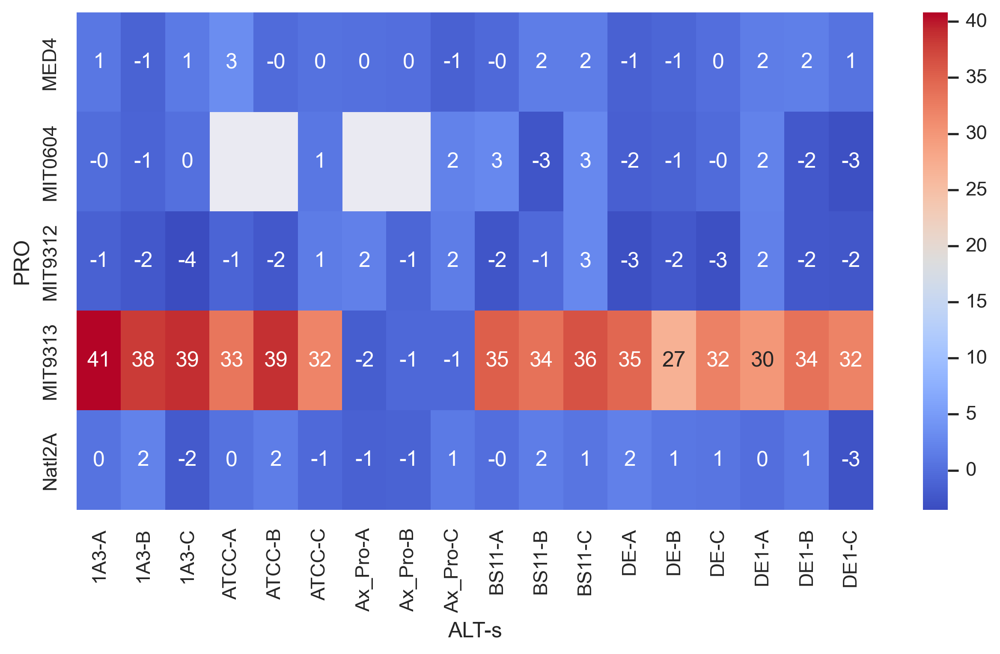

In [85]:
sns.heatmap(
    lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf.PRO.isin(porder)
              ].pivot_table(index=['PRO'], columns=['ALT', 's'], values='L'),
    cmap='coolwarm', annot=True,  fmt='.0f',
)


<AxesSubplot:xlabel='ALT-s', ylabel='PRO'>

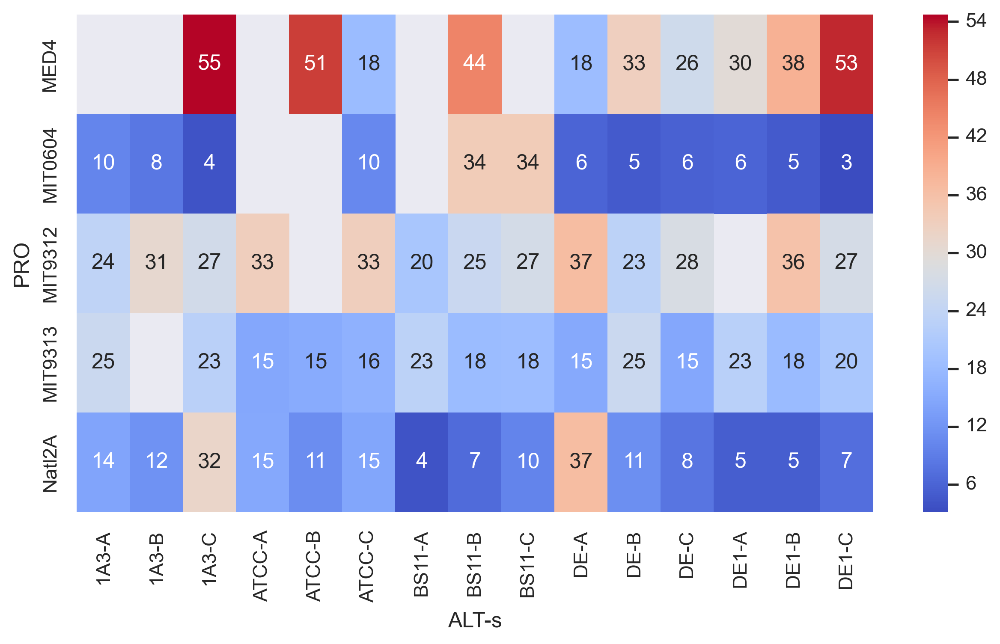

In [86]:
sns.heatmap(
    lagsdf.loc[lagsdf.experiment.isin(['e5']) & lagsdf.PRO.isin(porder)
              ].pivot_table(index=['PRO'], columns=['ALT', 's'], values='L'),
    cmap='coolwarm', annot=True,  fmt='.0f',
)


<AxesSubplot:xlabel='ALT-s', ylabel='PRO'>

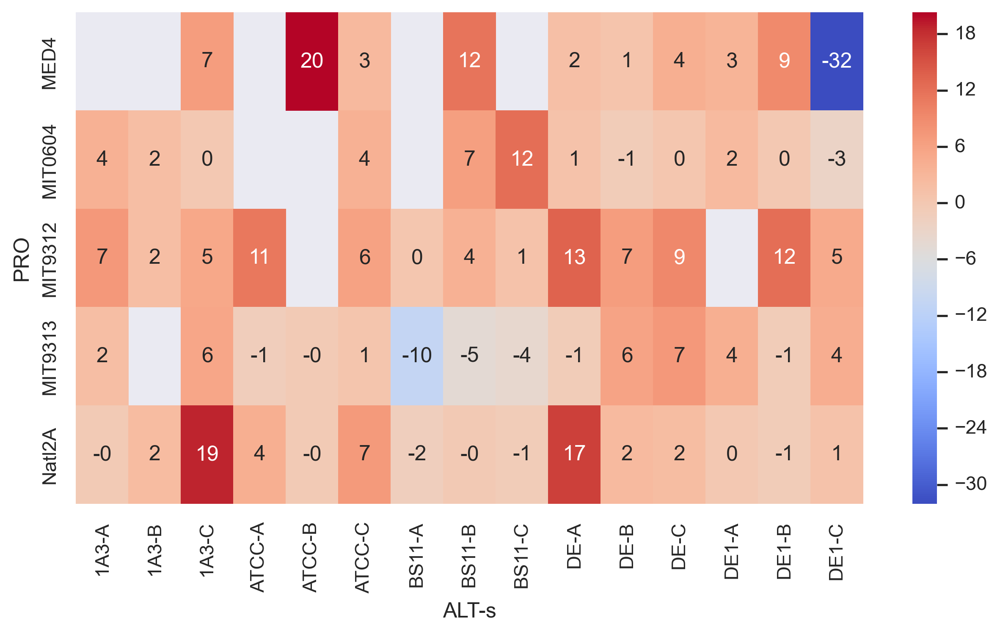

In [107]:
sns.heatmap(
    lagsdf.loc[lagsdf.experiment.isin(['e5']) & lagsdf.PRO.isin(porder)
              ].pivot_table(index=['PRO'], columns=['ALT', 's'], values='L_init'),
    cmap='coolwarm', annot=True,  fmt='.0f',
)


In [92]:
t = lagsdf.loc[lagsdf.experiment.isin(['e5']) & lagsdf.PRO.isin(porder), 'L']
t.count(), (t >= 10).sum(), (t >= 20).sum(), (t >= 30).sum(), (t >= 40).sum(), (t >= 50).sum(), 

(64, 49, 31, 15, 4, 3)

In [108]:
t = lagsdf.loc[lagsdf.experiment.isin(['e5']) & lagsdf.PRO.isin(porder), 'L_init']
t.count(), (t <= 10).sum(), (t <= 10).mean(), (t >= 20).sum(), (t >= 30).sum(), (t >= 40).sum(), (t >= 50).sum(), 

(64, 56, 0.875, 1, 0, 0, 0)

In [93]:
t = lagsdf.loc[lagsdf.experiment.isin(['e5']) & lagsdf.PRO.isin(porder), 'L']
t.count(), (t >= 10).mean(), (t >= 20).mean(), (t >= 30).mean(), (t >= 40).mean(), (t >= 50).mean(), 

(64, 0.765625, 0.484375, 0.234375, 0.0625, 0.046875)

In [106]:
t = lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf.PRO.isin(porder) & lagsdf.culture.isin(['Co_Culture']), 'L']
t.count(), (t <= 4).sum(), (t <= 10).mean(), 

(73, 58, 0.7945205479452054)

In [105]:
t = lagsdf.loc[lagsdf.experiment.isin(['e1']) & lagsdf.PRO.isin(porder) & lagsdf.culture.isin(['Co_Culture']), 'L']
t.count(), (t <= 4).mean(), (t >= 20).mean(), (t >= 30).mean(), (t >= 40).mean(), (t >= 50).mean(), 

(73,
 0.7945205479452054,
 0.2054794520547945,
 0.1780821917808219,
 0.0136986301369863,
 0.0)

In [87]:
lagsdf.nsmallest(10, 'initiallogcells')

,experiment,sample,PRO,ALT,culture,experiment_sample,maxday,minday,maxlogcells,maxcells,...,initiallogcells,initiallog10cells,L_init,e1 coef,e1 L_init,L_init_e1coef,maxday_e1,experiment1,max day diff (actual - computed),s
325,e5,11C,MED4,DE1,Co_Culture,"e5, 11C",69.01,61.86,15.996908,8.858681e+06,...,3.332205,1.447158,-32.029757,0.294652,-4.753137,26.028038,38.228825,e5,30.781175,C
356,e5,23C,MIT9312,ATCC,Co_Culture,"e5, 23C",44.16,33.95,18.167771,7.765380e+07,...,3.525848,1.531257,6.062113,0.370899,-2.552212,4.683187,36.924601,e5,7.235399,C
383,e5,8A,MIT9312,DE,Co_Culture,"e5, 8A",44.16,36.89,17.134202,2.762419e+07,...,4.158883,1.806180,13.401163,0.307613,-3.619839,1.979274,38.560887,e5,5.599113,A
343,e5,18C,MIT9312,BS11,Co_Culture,"e5, 18C",39.84,28.84,18.747340,1.386329e+08,...,4.243093,1.842752,0.902104,0.342857,-3.111164,-2.464023,39.192859,e5,0.647141,C
369,e5,3B,MIT9312,1A3,Co_Culture,"e5, 3B",44.16,33.95,18.277176,8.663167e+07,...,4.653960,2.021189,1.718129,0.326044,-2.702401,2.376628,39.080971,e5,5.079029,B
355,e5,23A,MIT9312,ATCC,Co_Culture,"e5, 23A",44.16,33.95,18.446846,1.026510e+08,...,5.069772,2.201774,11.261150,0.398279,-2.327666,10.572797,31.259537,e5,12.900463,A
324,e5,11B,MED4,DE1,Co_Culture,"e5, 11B",48.95,39.84,17.112297,2.702566e+07,...,5.247024,2.278754,9.135388,0.303269,-4.009267,9.825424,35.115309,e5,13.834691,B
370,e5,3C,MIT9312,1A3,Co_Culture,"e5, 3C",36.89,29.83,18.197696,8.001269e+07,...,5.252273,2.281033,5.372088,0.299094,-4.174249,-6.392172,39.107923,e5,-2.217923,C
348,e5,20B,MIT0604,BS11,Co_Culture,"e5, 20B",46.87,36.89,18.115179,7.367537e+07,...,5.276108,2.291385,6.591785,0.316636,-3.094895,6.321645,37.453460,e5,9.416540,B
342,e5,18B,MIT9312,BS11,Co_Culture,"e5, 18B",35.94,25.90,18.166410,7.754818e+07,...,5.552069,2.411233,3.860807,0.307849,-3.564900,-5.035763,37.410863,e5,-1.470863,B


In [88]:
lagsdf.nsmallest(10, 'L_init').T

,325,291,65,66,69,67,338,12,68,11
experiment,e5,e4,e1,e1,e1,e1,e5,e1,e1,e1
sample,11C,25C,36A,36B,37C,37A,17A,14A,37B,13C
PRO,MED4,MIT0604,allP,allP,all,all,MIT9313,Natl2A,all,MIT9312
ALT,DE1,ATCC,all_Pro,all_Pro,all,all,BS11,DE1,all,DE1
culture,Co_Culture,Co_Culture,All_Pro,All_Pro,All_strains,All_strains,Co_Culture,Co_Culture,All_strains,Co_Culture
experiment_sample,"e5, 11C","e4, 25C","e1, 36A","e1, 36B","e1, 37C","e1, 37A","e5, 17A","e1, 14A","e1, 37B","e1, 13C"
maxday,69.01,13.94,6.67431,1.92569,16.9521,22.9514,29.83,2.83125,20.6604,13.6944
minday,61.86,4.07,-0.325694,-5.07431,0,0,22.83,-4.16875,0,0
maxlogcells,15.9969,18.1614,18.5093,17.2831,19.4416,19.6746,15.5418,15.9849,19.498,18.8714
maxcells,8.85868e+06,7.71609e+07,1.0927e+08,3.20603e+07,2.77561e+08,3.50405e+08,5.61961e+06,8.75306e+06,2.93686e+08,1.56941e+08


In [ ]:
sns.catplot(data=lagsdf.loc[lagsdf.experiment == 'e1'],
            x='culture', y='coef', kind='box',
           )

In [ ]:
sns.catplot(data=lagsdf.loc[lagsdf.experiment == 'e1'],
            hue='culture', y='coef', kind='box', x='PRO', aspect=3,
           )